library(Seurat)
library(ggplot2)
library(cowplot)


<h1>(Morris et al. 2022)</h1

In [2]:
library(Seurat)
library(EnhancedVolcano)
library(dplyr)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject

Loading required package: ggplot2

Loading required package: ggrepel


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [4]:
load( "data/MesenchymalP1-P14-Adult2.Rdata")



In [5]:
pbmcM
colnames(pbmcM[[]])
pbmc <- pbmcM

An object of class Seurat 
11124 features across 31441 samples within 1 assay 
Active assay: SCT (11124 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

[1] "orig.ident"       "nCount_RNA"       "nFeature_RNA"     "Sample"          
 [5] "nCount_SCT"       "nFeature_SCT"     "X"                "x"               
 [9] "SCT_snn_res.0.5"  "seurat_clusters"  "nGene"            "nUMI"            
[13] "batch"            "fraction.mito"    "condition"        "dominant_index"  
[17] "percent_dominant" "Level0"           "doubletSimScore"  "doubletSimCall"  
[21] "mouse"            "Level1"           "Level2"           "CellType"        
[25] "SCT_snn_res.0.6"  "Louvain"          "SCT_snn_res.1.2"

<h1> Cluster naming </h1>

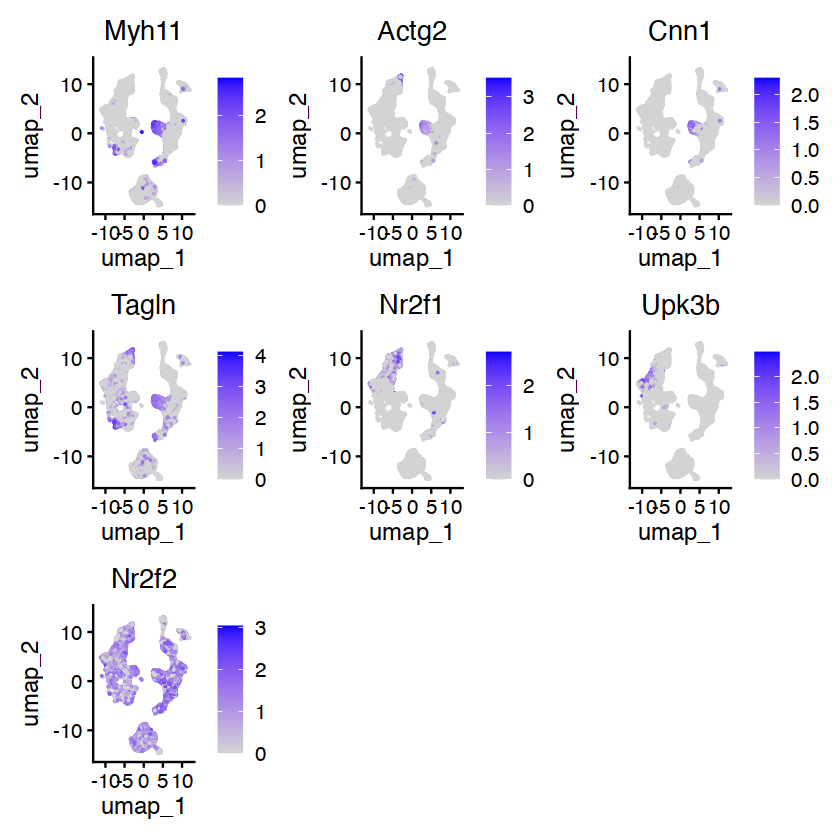

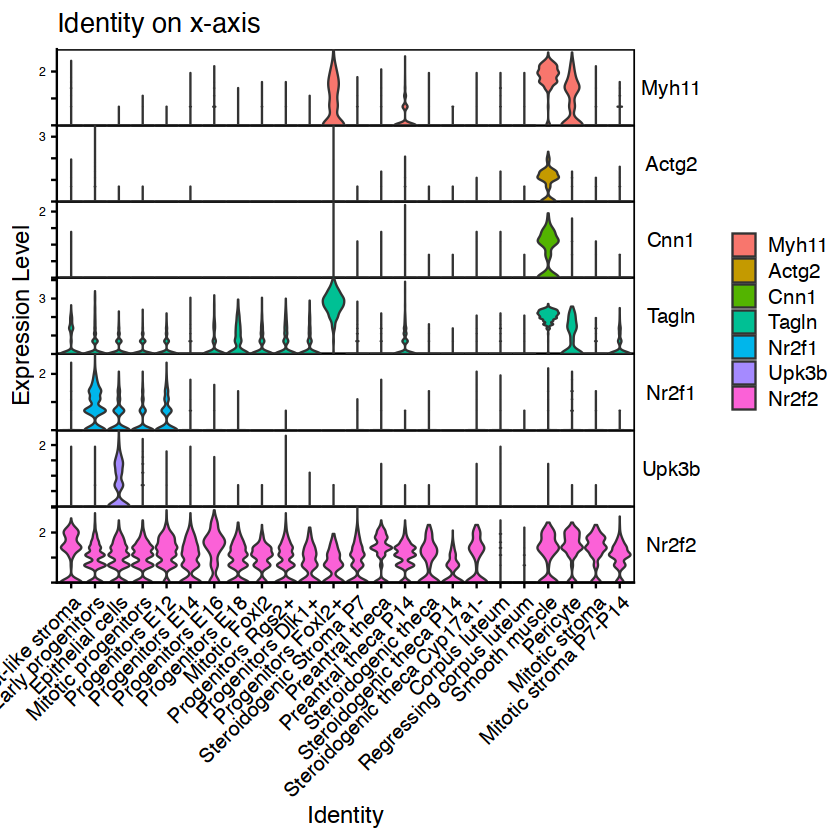

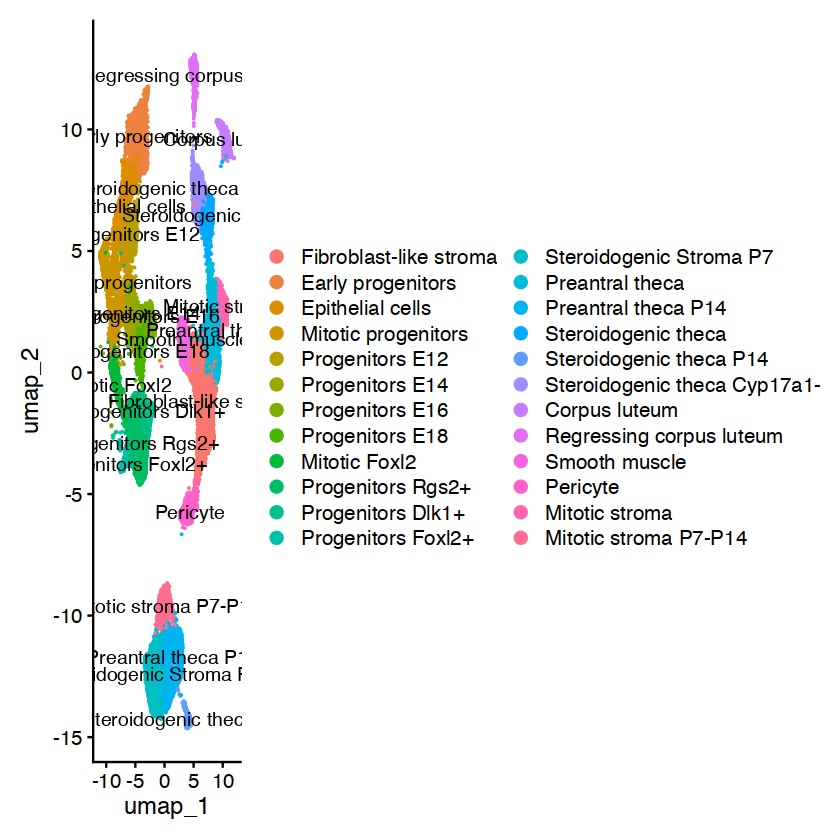

In [12]:
#Smooth muscle
markers = c("Myh11","Actg2","Cnn1","Tagln",'Nr2f1','Upk3b','Nr2f2')
FeaturePlot(pbmc, features = markers,raster=FALSE)
VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [8]:
pbmc <- RenameIdents(pbmc, '10' = 'Smooth muscle')

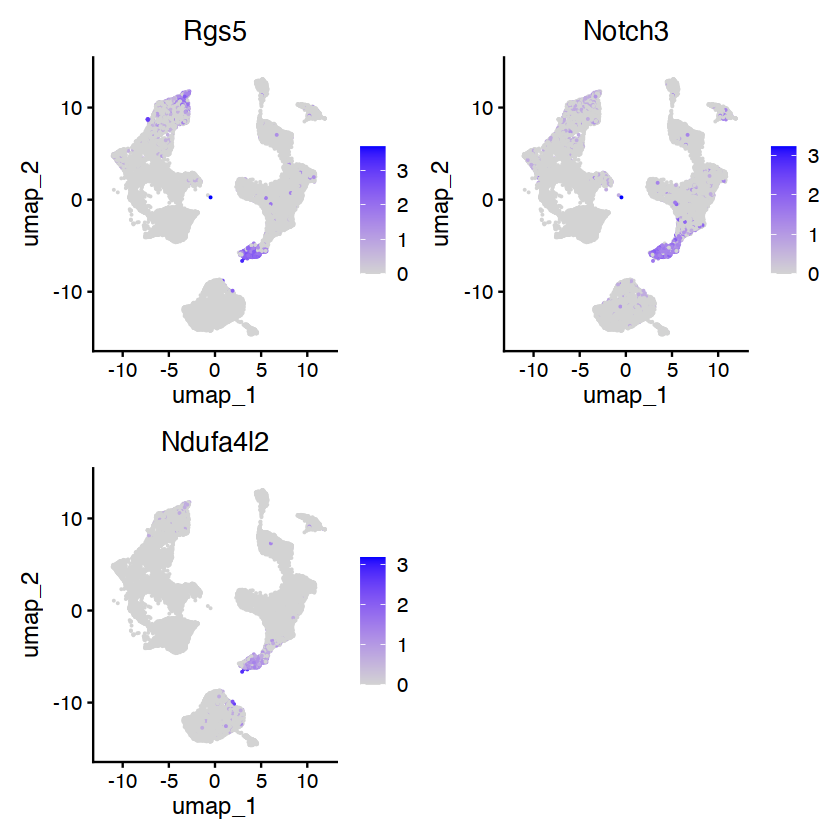

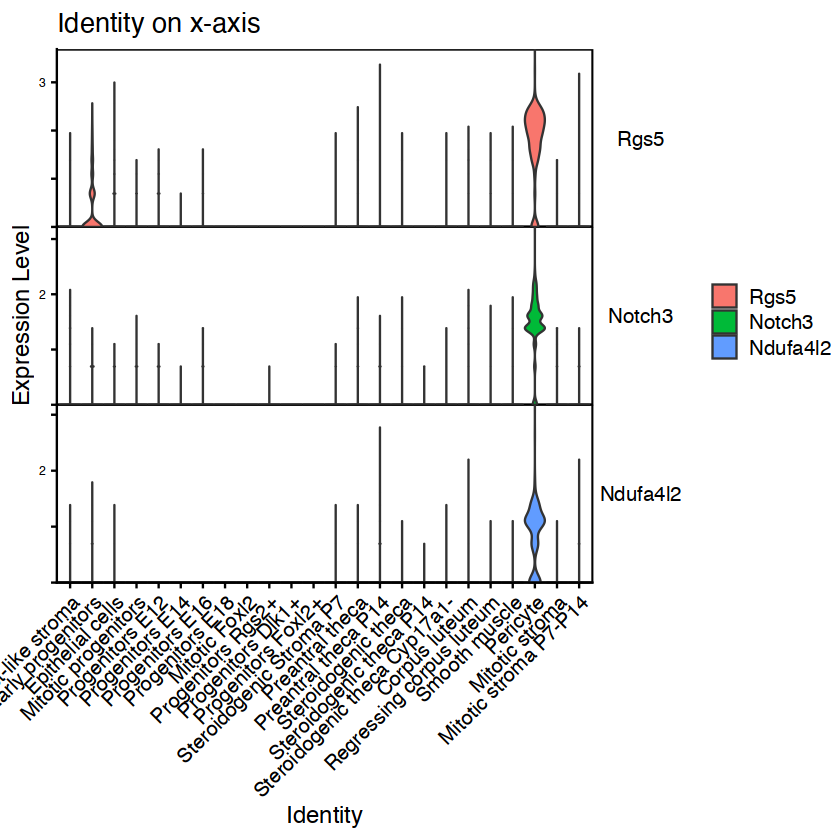

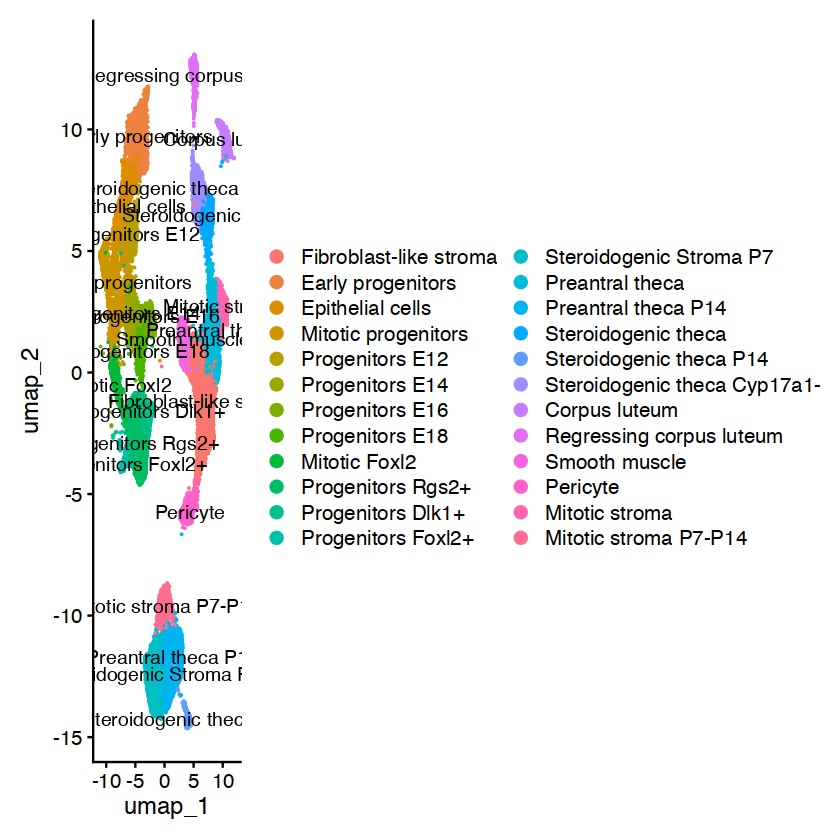

In [13]:
#Pericyte

markers = c("Rgs5","Notch3","Ndufa4l2")
FeaturePlot(pbmc, features = markers,raster=FALSE)
VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [10]:
pbmc <- RenameIdents(pbmc, '16' = 'Pericyte'
                          )

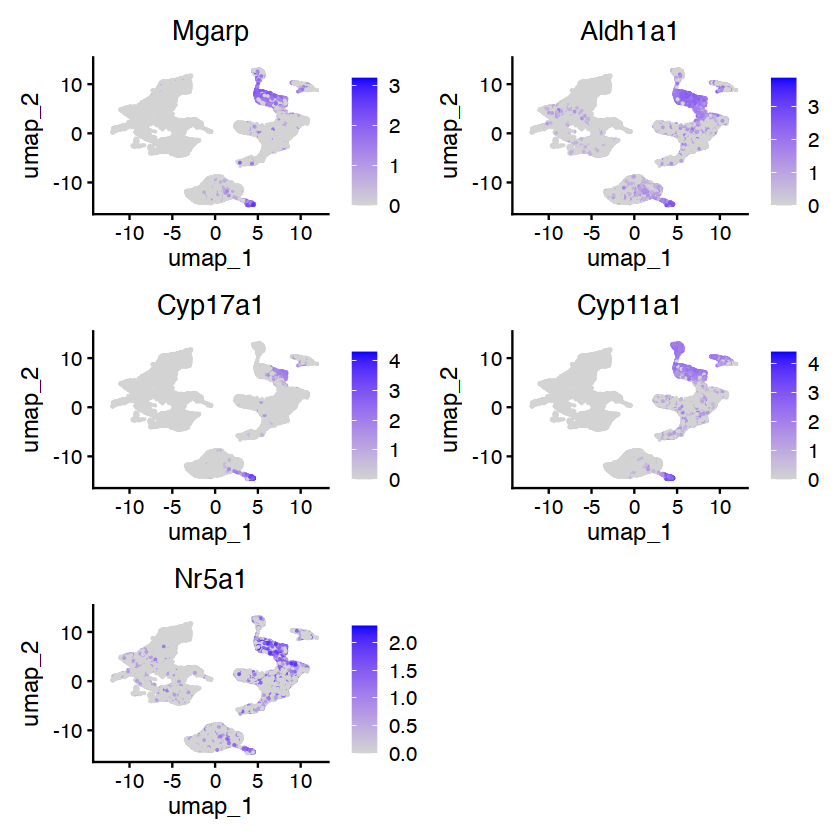

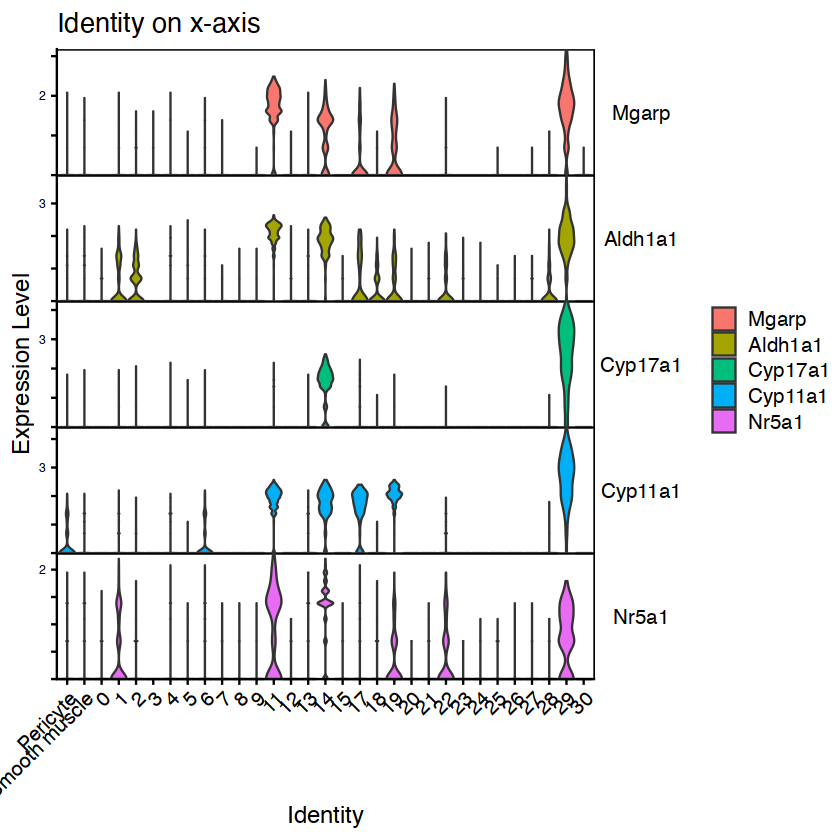

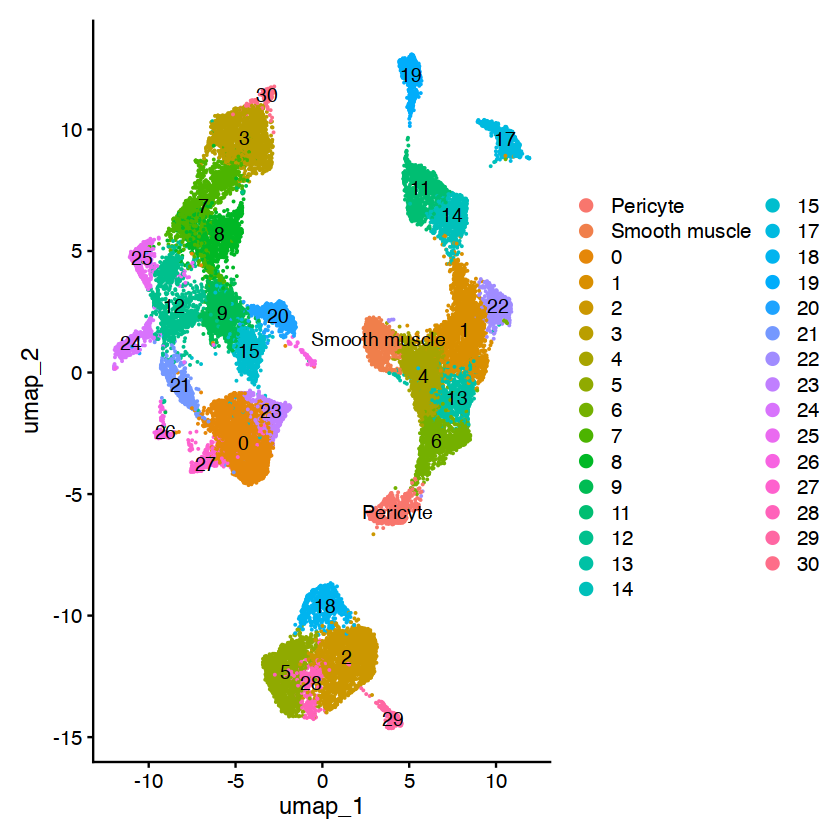

In [11]:
#Atral steroidogenic theca

markers = c("Mgarp","Aldh1a1","Cyp17a1","Cyp11a1","Nr5a1")
FeaturePlot(pbmc, features = markers,raster=FALSE)
VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [12]:
pbmc <- RenameIdents(pbmc, '29' = 'Steroidogenic theca P14', '14' = 'Steroidogenic theca'
                          )

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Neat1”


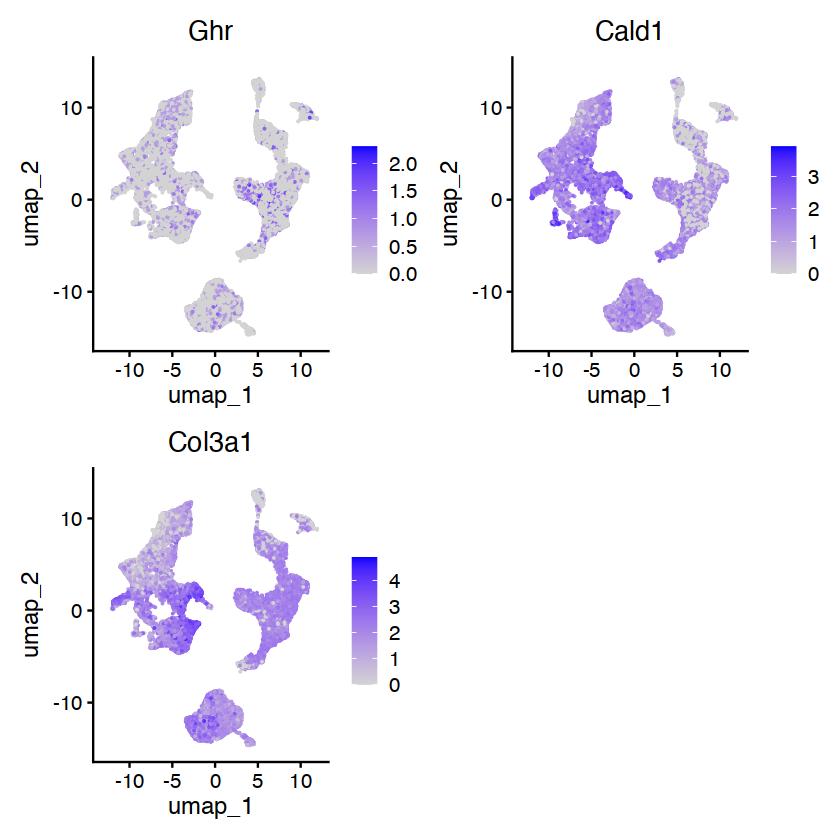

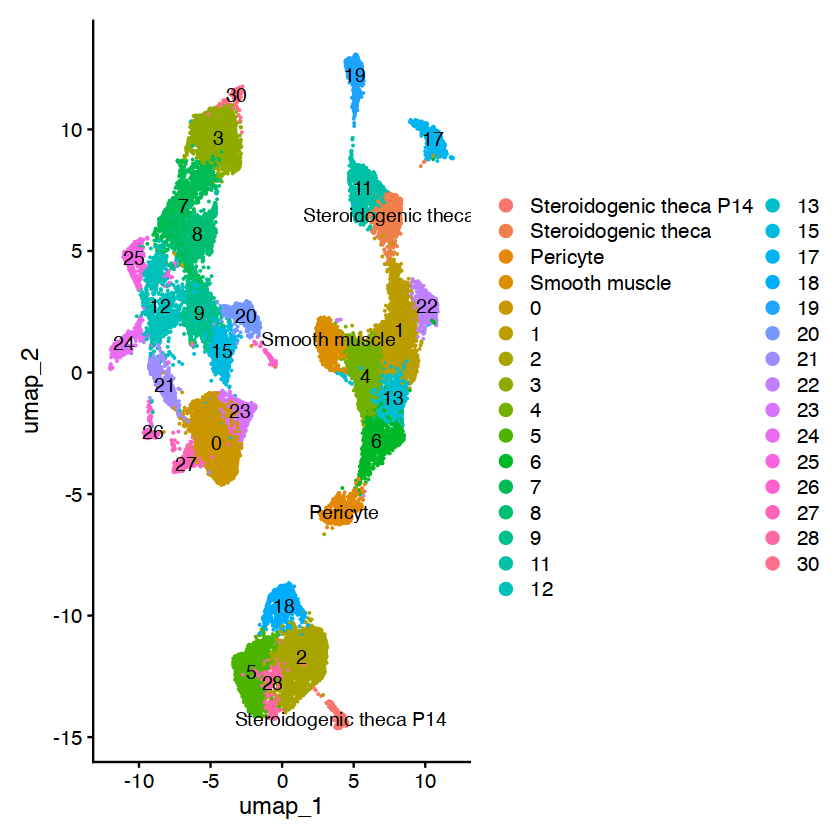

In [13]:
#Atretic CL Ghr Active CL
markers = c("Ghr","Cald1","Neat1","Col3a1")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [14]:
pbmc <- RenameIdents(pbmc, '17' = 'Corpus luteum', '19' = 'Regressing corpus luteum'
                          )

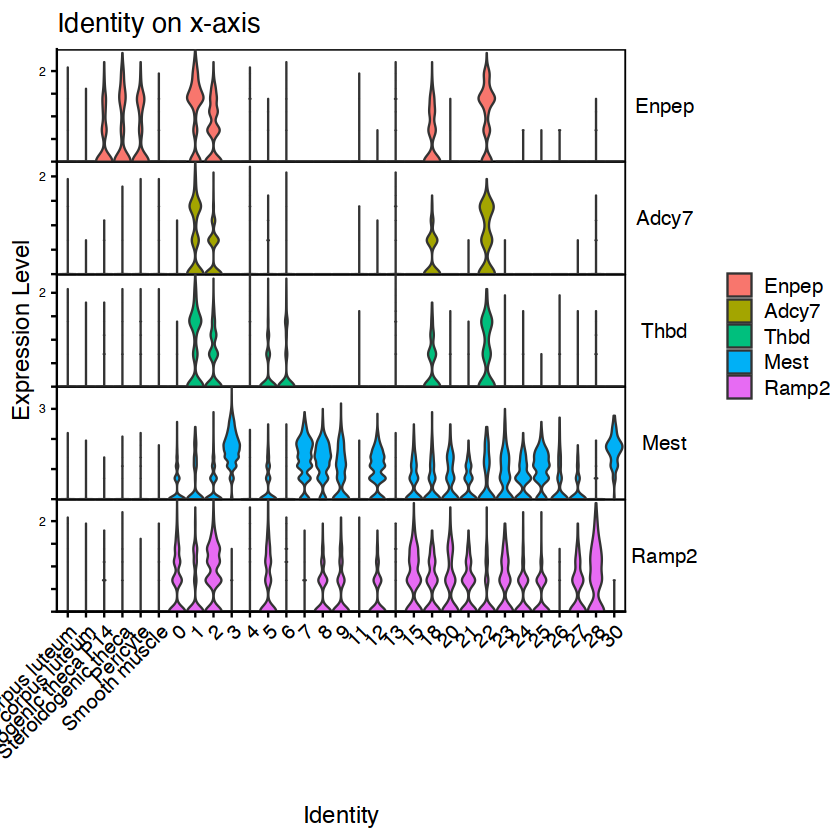

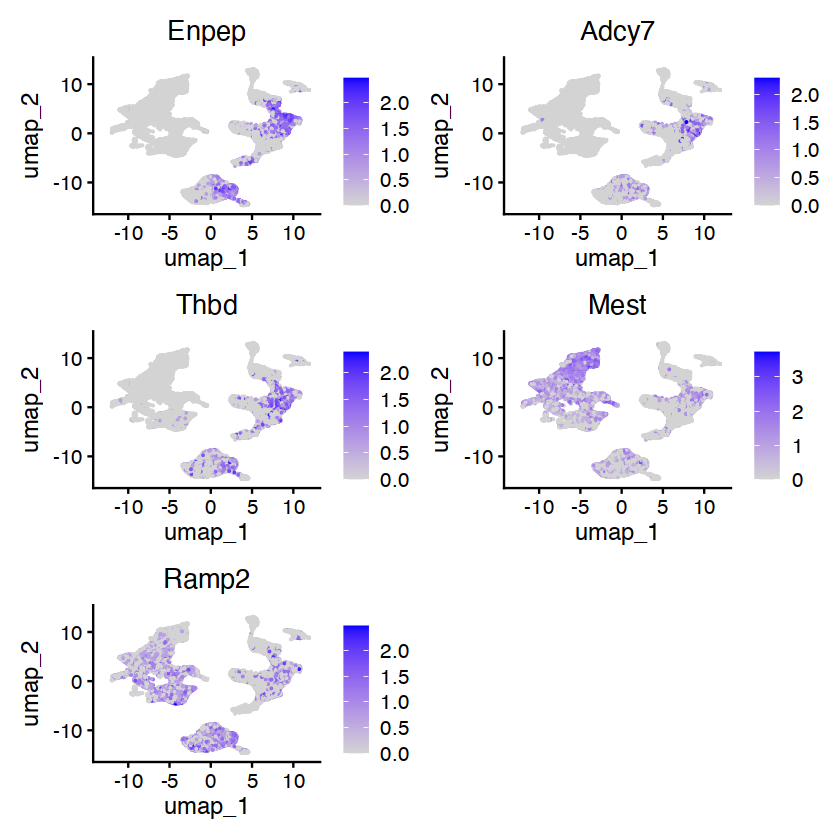

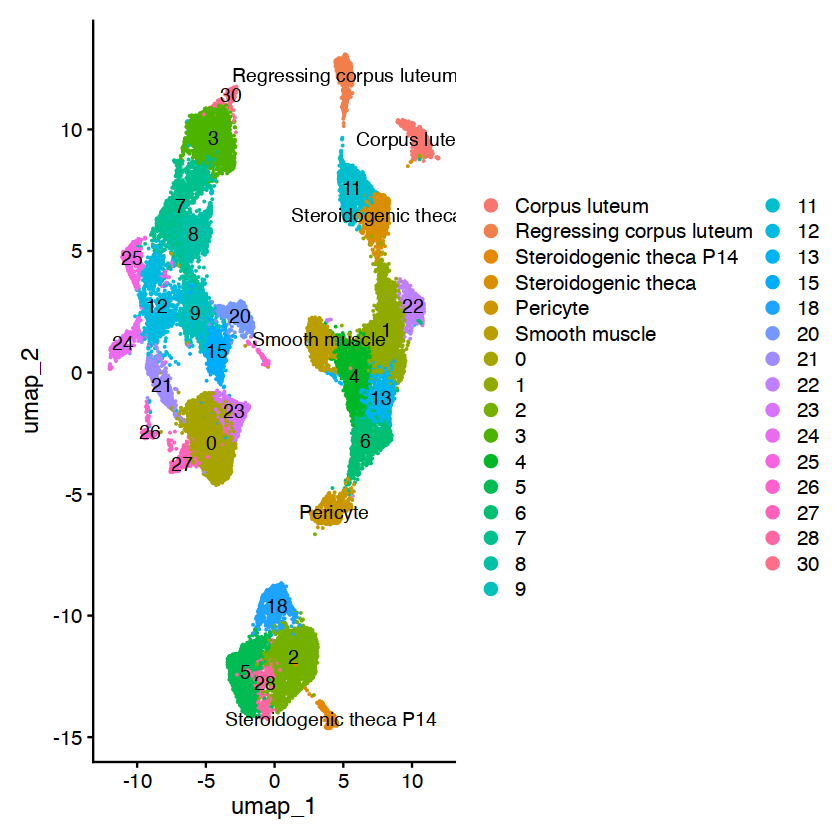

In [15]:
#Preantral theca

markers = c("Enpep","Adcy7","Thbd","Mest","Ramp2")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

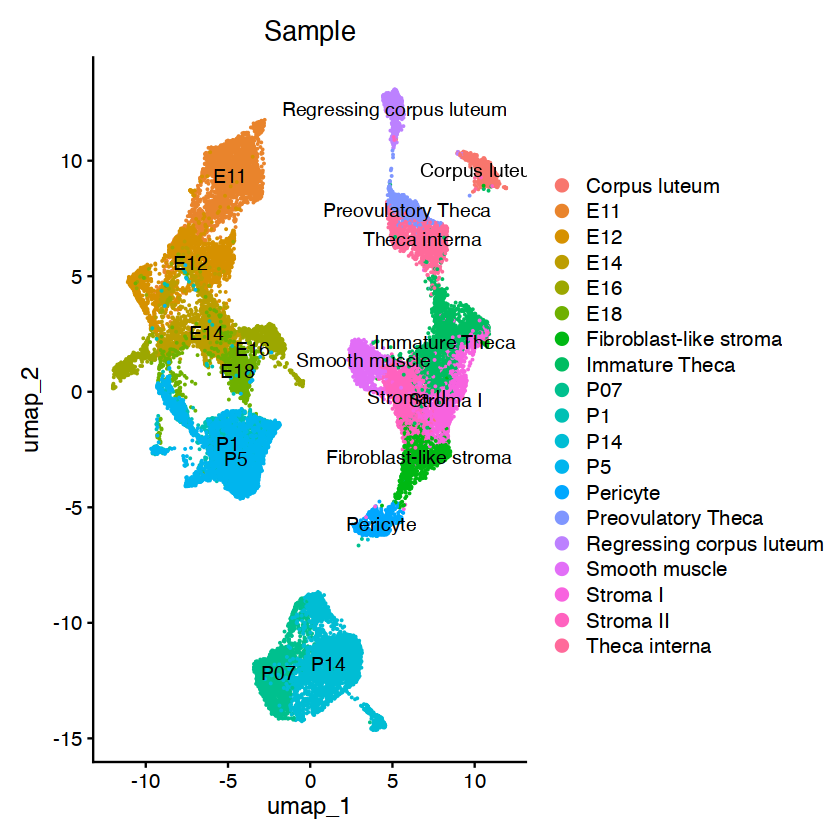

In [17]:
DimPlot(pbmc, reduction = "umap", group.by = "Sample", label = TRUE)

In [19]:
pbmc <- RenameIdents(pbmc, '1' = 'Preantral theca', '2' = 'Preantral theca P14', '18' = 'Preantral theca P7-P14'
                          )

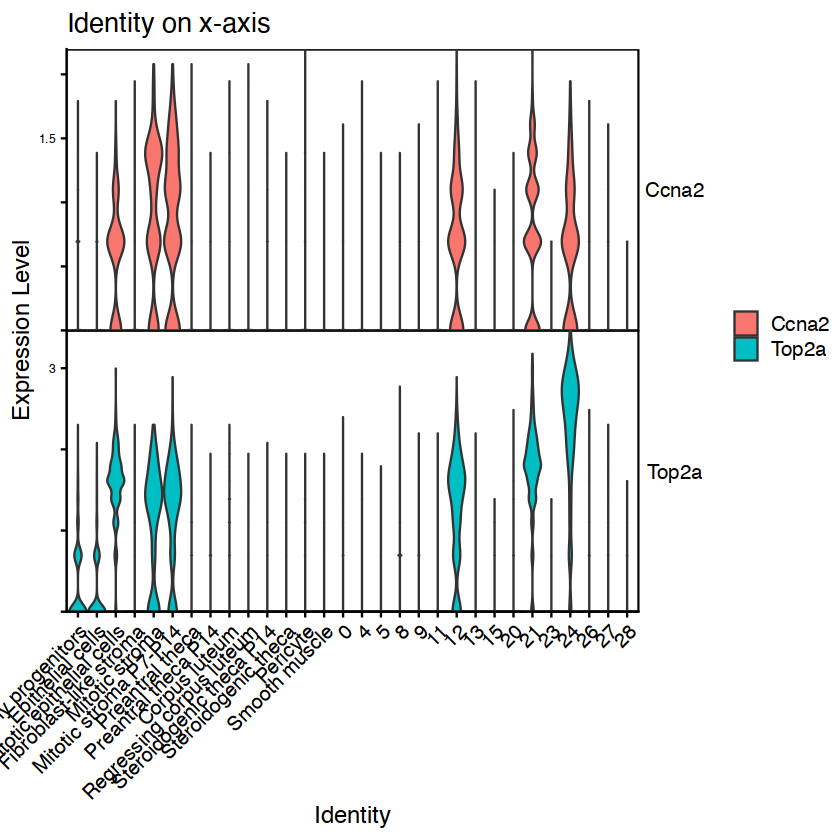

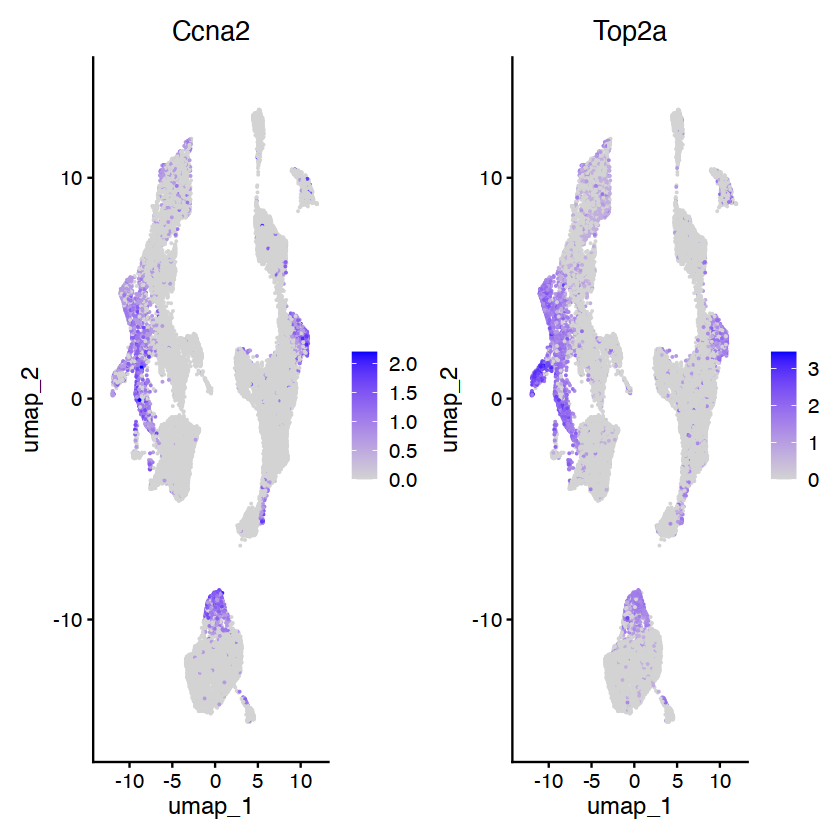

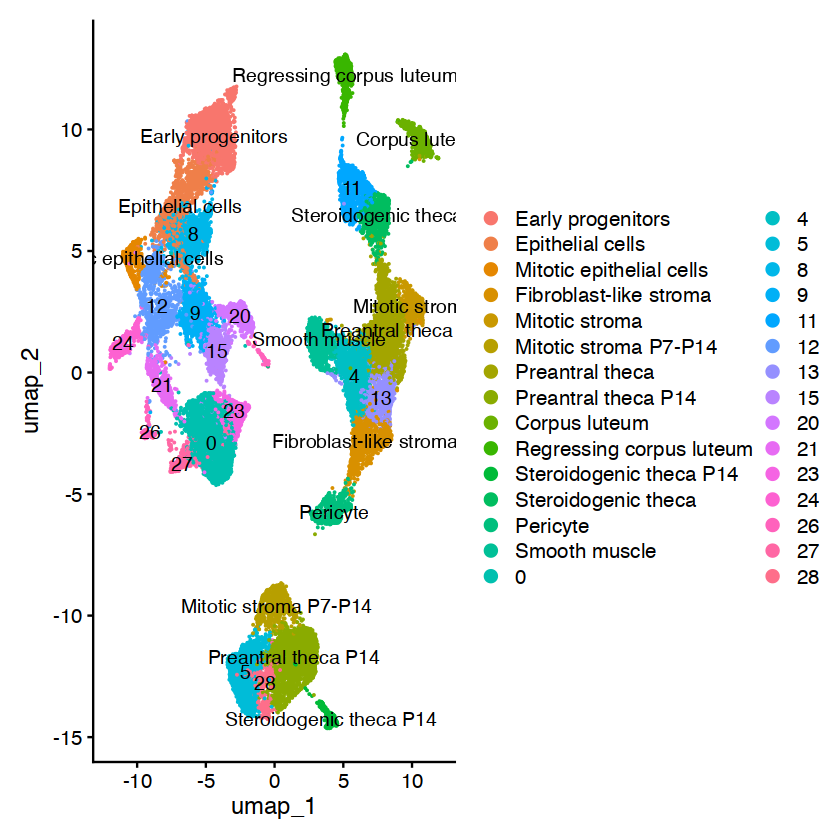

In [29]:
# Mitotic Ccna2
markers = c("Ccna2","Top2a")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [31]:
pbmc <- RenameIdents(pbmc, '12' = 'Mitotic stroma E', '21' = "Mitotic stroma P", '24' = "Mitotic stroma E2" )

In [32]:
pbmc[["CellType2"]]  <- Idents(object = pbmc)

In [34]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "Mitotic stroma P"])
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "Mitotic stroma E2"])


E12 E18  P1  P5 
  1  57 215 325 


E14 E16 E18 
  2 479   2 

In [42]:
pbmc <- subset(pbmc, idents = c("Mitotic stroma E2"), invert = TRUE)

In [44]:
pbmc <- subset(pbmc, idents = c("26"), invert = TRUE)

In [21]:
pbmc <- RenameIdents(pbmc, '22' = 'Mitotic stroma', 'Preantral theca P7-P14' = "Mitotic stroma P7-P14" )


In [37]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "27"])


E18 P07  P1 P14  P5 
  6   1  68   1 240 

In [38]:
pbmc <- RenameIdents(pbmc, 'Mitotic stroma P' = 'Mitotic Foxl2', '27' = "Stroma Foxl2" )

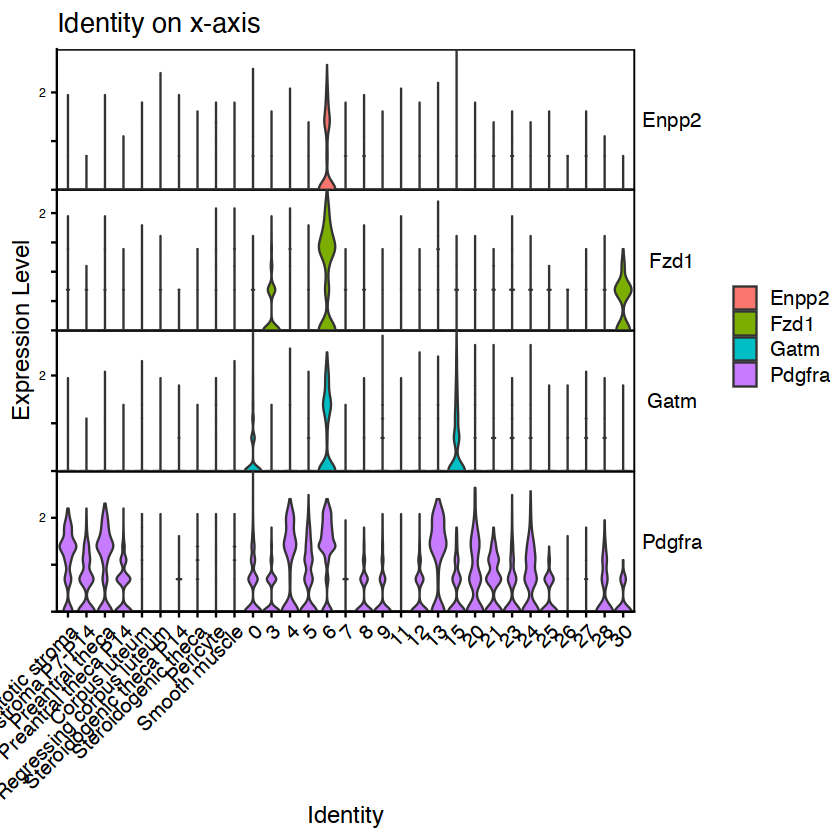

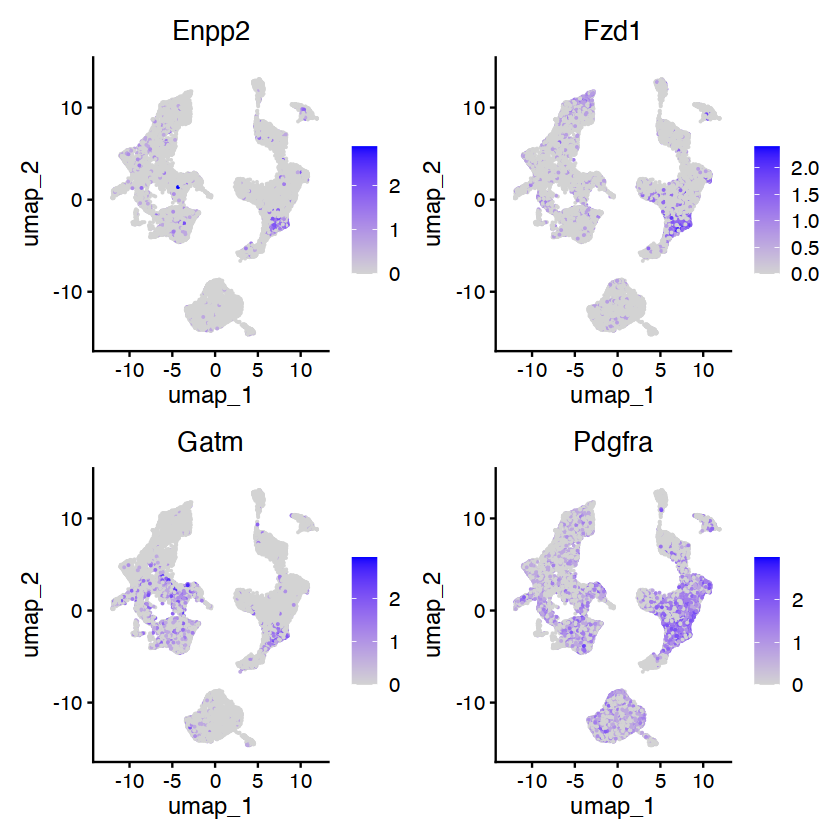

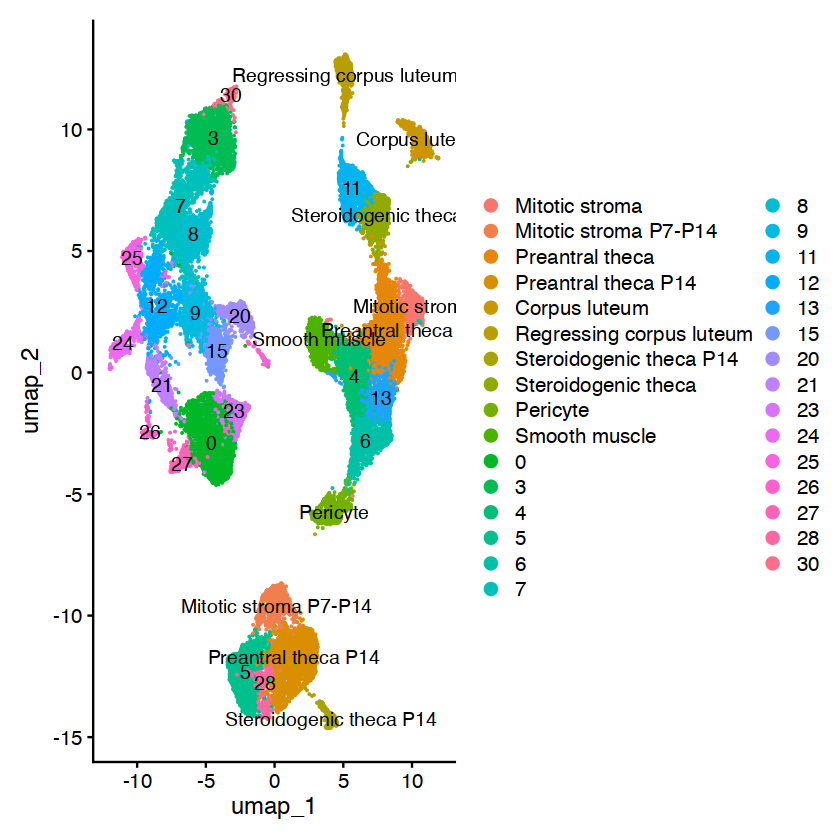

In [22]:
#Fibroblast-like stroma

markers = c("Enpp2","Fzd1","Gatm","Pdgfra")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)

In [23]:
pbmc <- RenameIdents(pbmc, '6' = 'Fibroblast-like stroma')


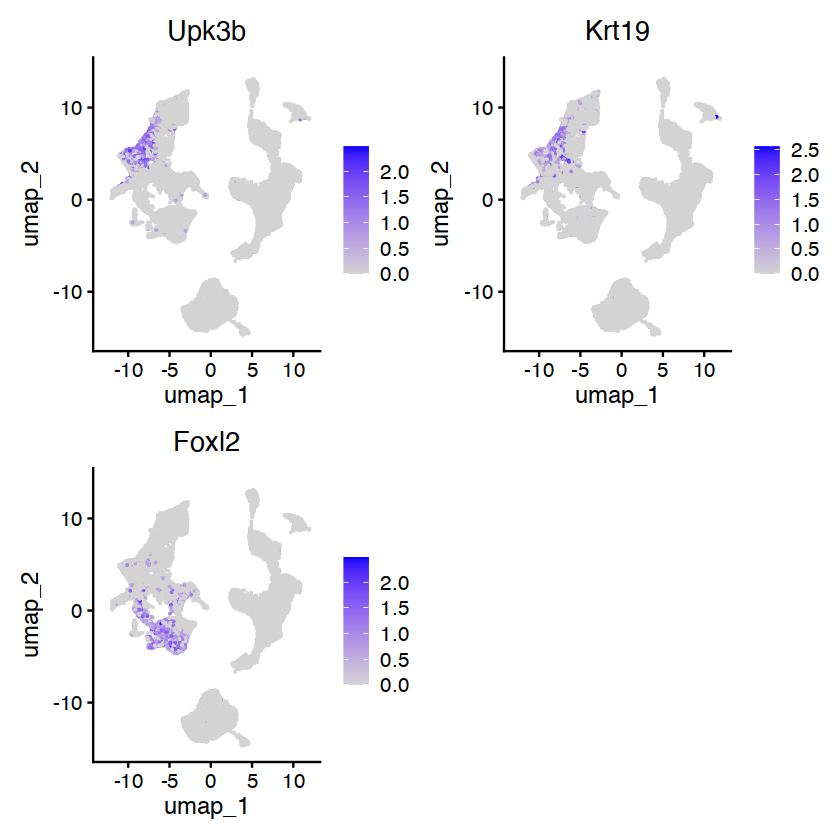

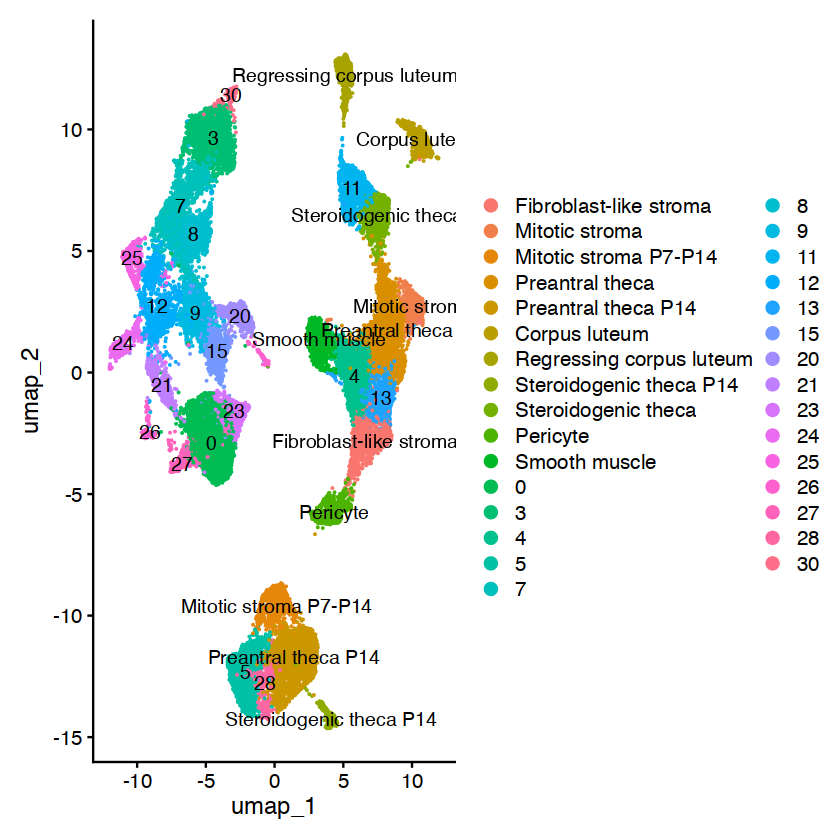

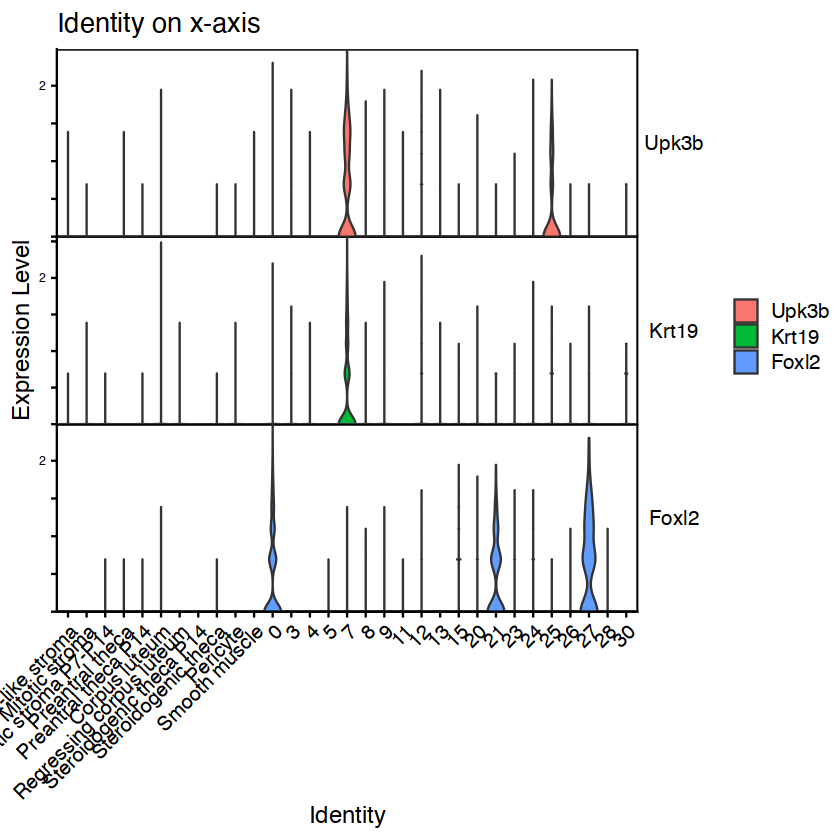

In [24]:
# epithelial cells
FeaturePlot(pbmc, features = c("Upk3b","Krt19","Foxl2"))
DimPlot(pbmc, reduction = "umap", label =TRUE)
VlnPlot(pbmc, c("Upk3b","Krt19","Foxl2"),   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")

In [25]:
pbmc <- RenameIdents(pbmc, '7' = 'Epithelial cells','25' = 'Mitotic epithelial cells'
                          )

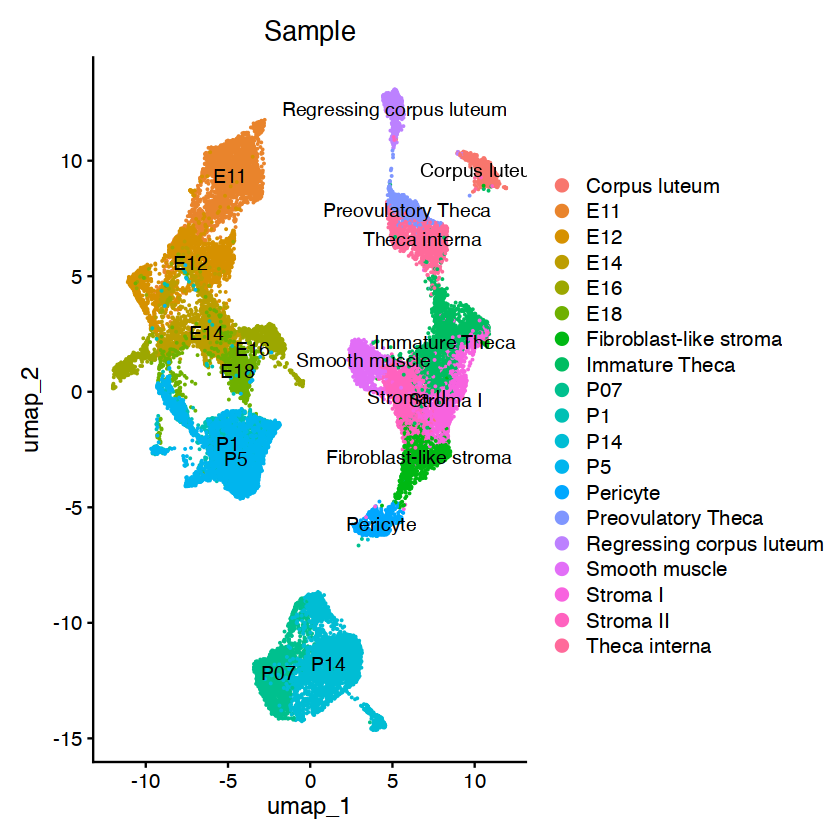

In [30]:
DimPlot(pbmc, reduction = "umap", group.by = "Sample", label =TRUE)

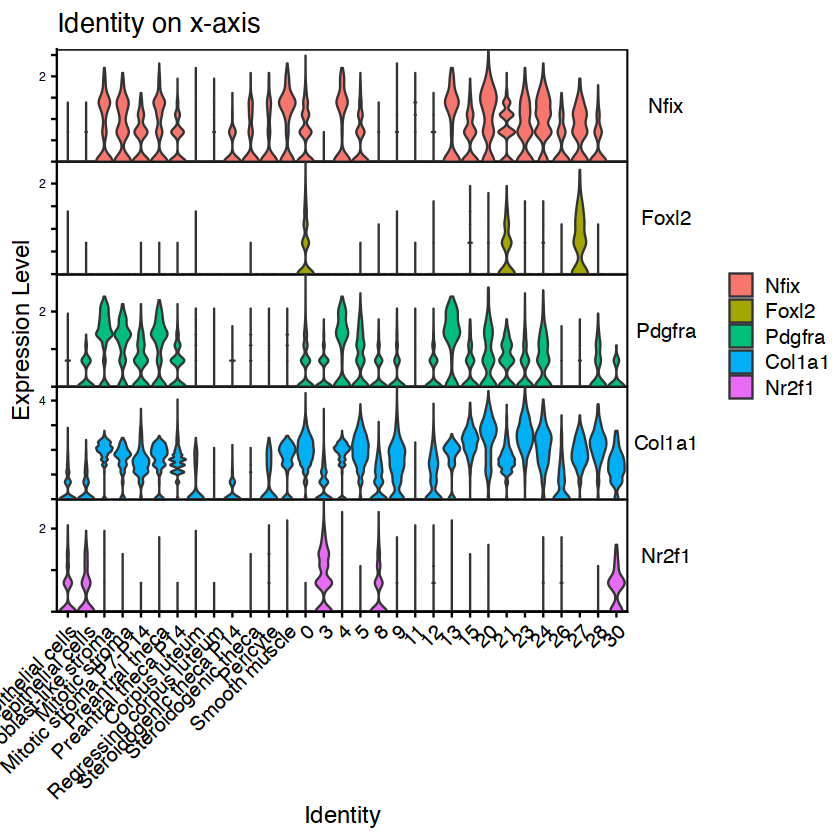

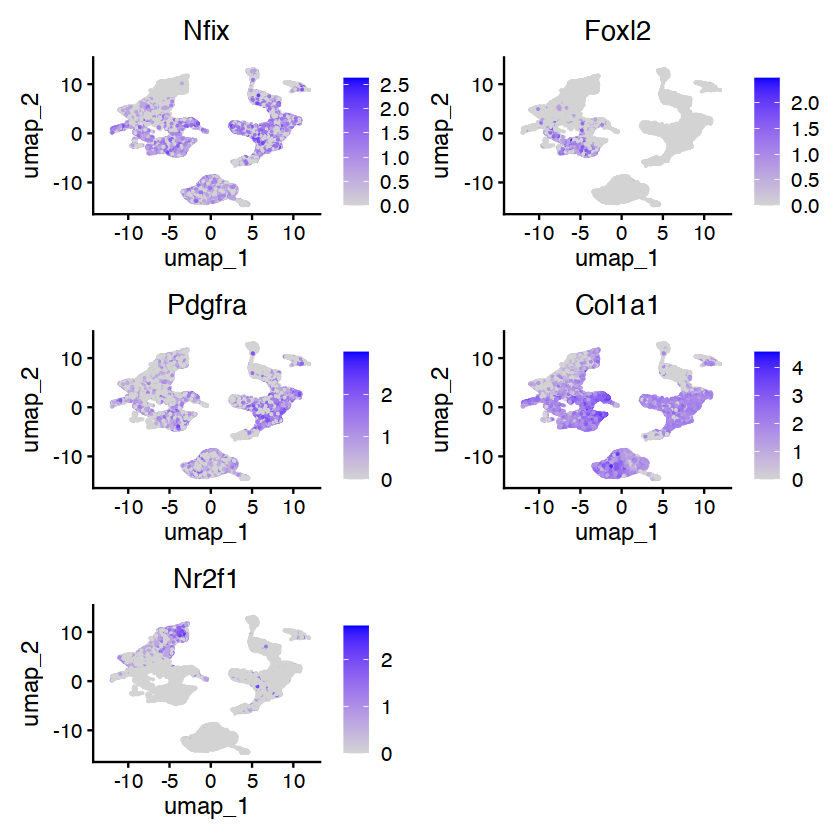

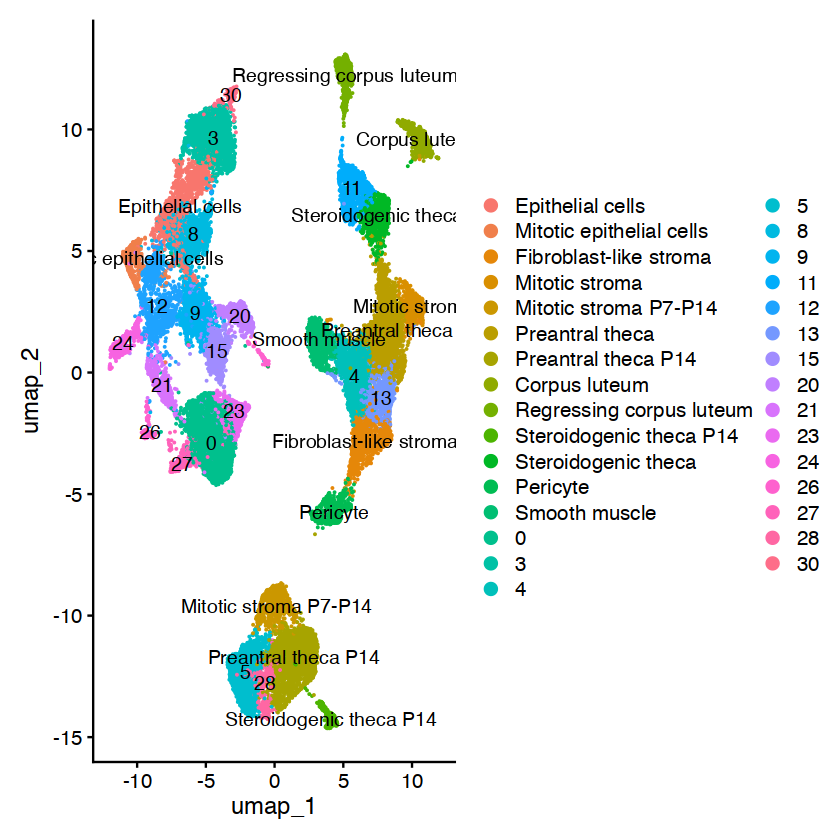

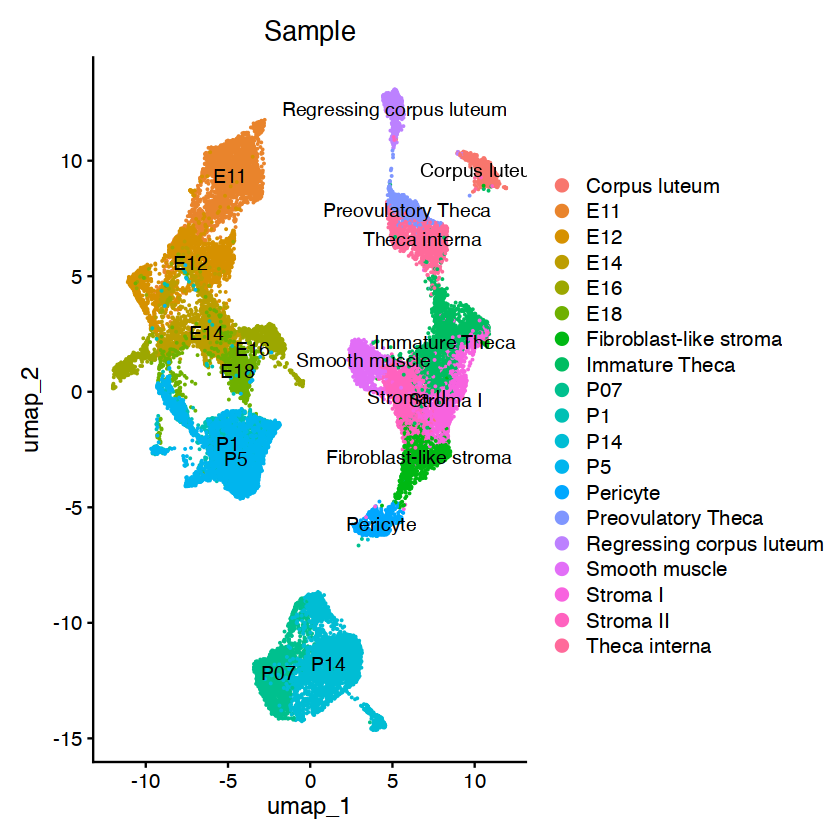

In [26]:
#Early stroma progenitors

markers = c("Nfix","Foxl2","Pdgfra","Col1a1","Nr2f1")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label =TRUE,raster=FALSE)
DimPlot(pbmc, reduction = "umap", group.by = "Sample", label =TRUE,raster=FALSE)

In [27]:
pbmc <- RenameIdents(pbmc, '3' = 'Early progenitors','30' = 'Early progenitors')

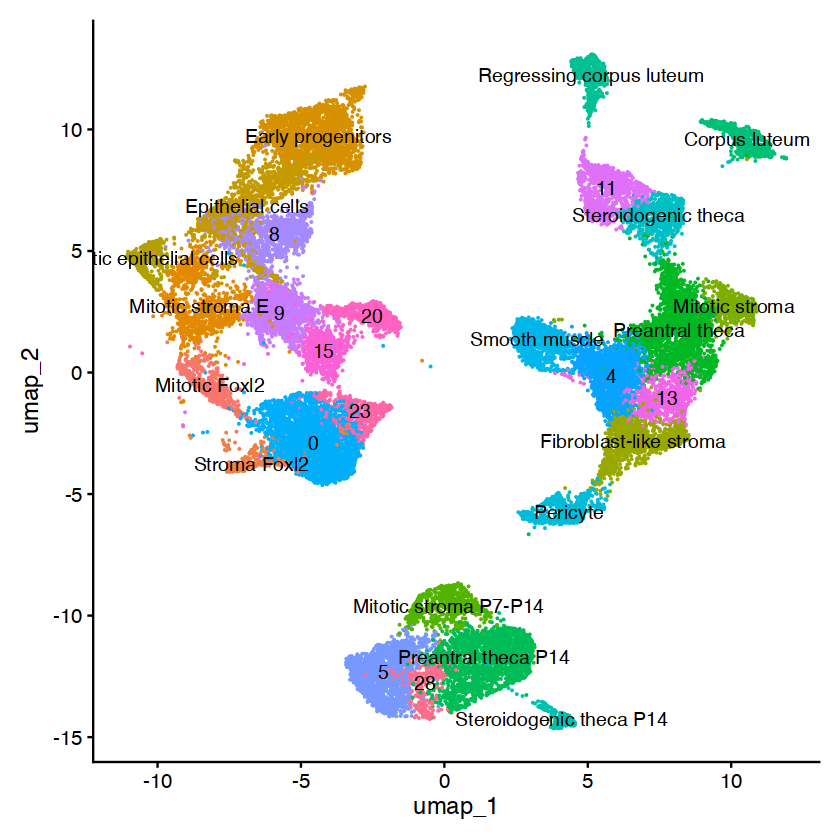

In [45]:
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()

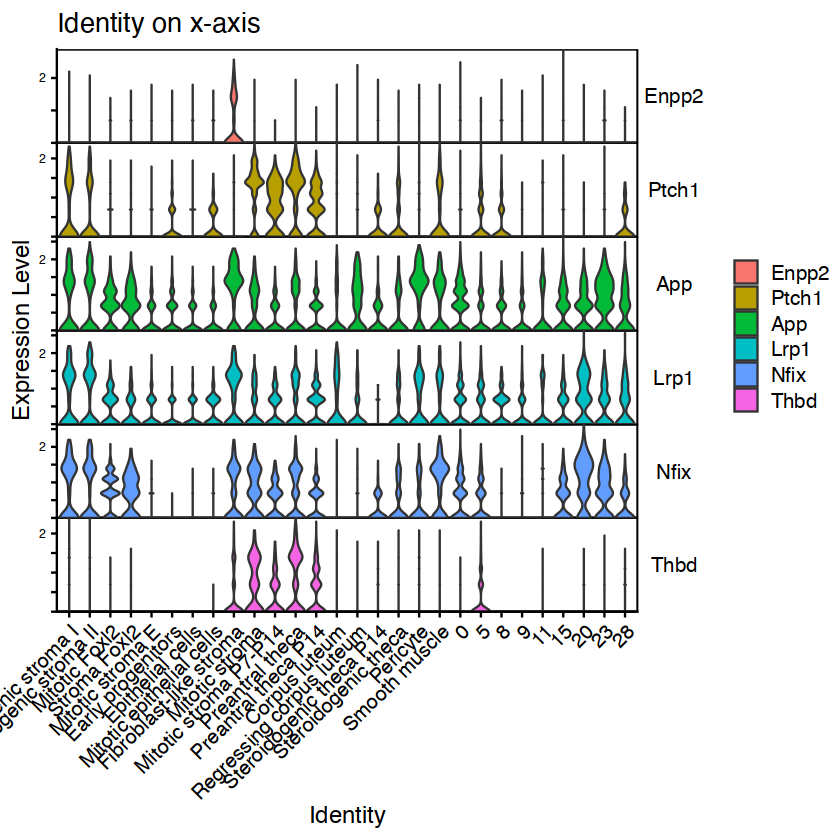

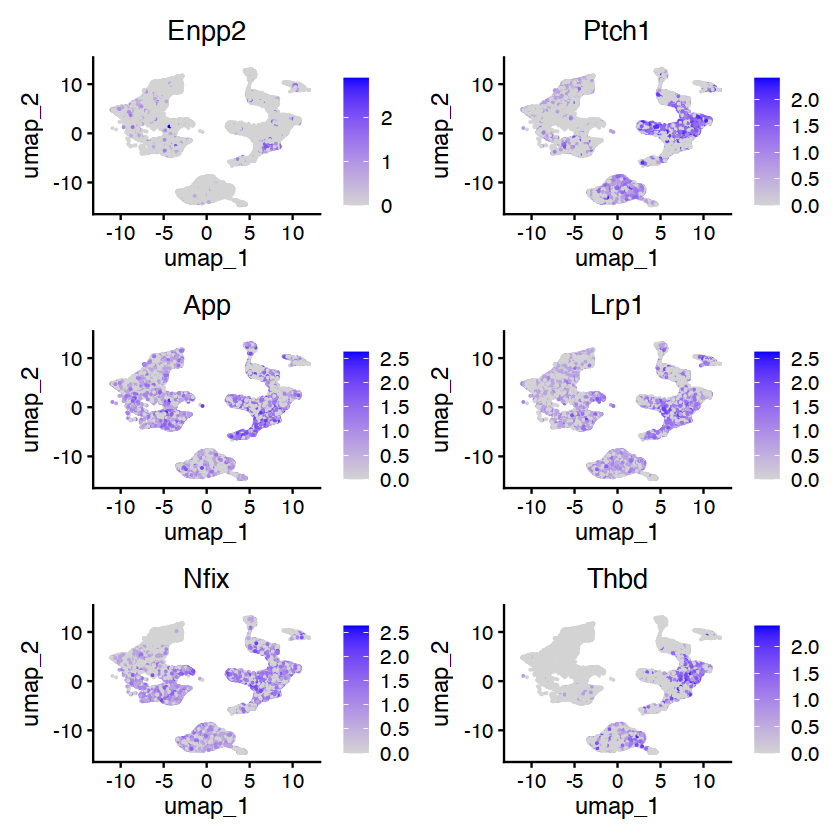

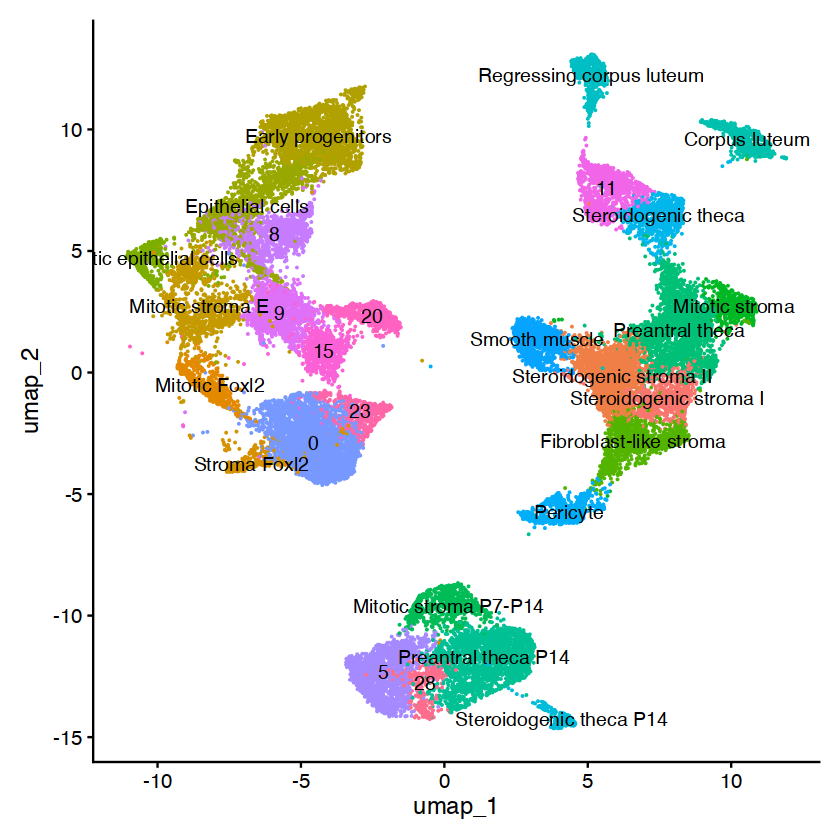

In [50]:
# Steroidogenic Stroma

markers = c("Enpp2","Ptch1","App","Lrp1","Nfix","Thbd") 

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()

In [47]:
pbmc <- RenameIdents(pbmc, '13' = 'Steroidogenic stroma I','4' = 'Steroidogenic stroma II')

In [ ]:
pbmc <- RenameIdents(pbmc, '5' = 'Steroidogenic stroma P7-P14','28' = 'Steroidogenic stroma P7-P14')

pbmc <- RenameIdents(pbmc, '0' = 'Steroidogenic stroma P7','28' = 'Steroidogenic stroma P14')

In [48]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "5"])


 P07  P14 
1761   30 

In [52]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "28"])
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "0"])
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "23"])


P07 P14 
 16 290 


 E16  E18   P1   P5 
   3   17 1359 1752 


E16 E18  P1  P5 
  1   2 264 263 

In [53]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "8"])
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "9"])


 E11  E12  E14  E16  E18   P1   P5 
   9 1153   52    7    3    3    1 


 E11  E12  E14  E16  E18   P1 
  12    7 1113   11   71    3 

In [54]:
pbmc <- RenameIdents(pbmc, '8' = 'Progenitors E12','9' = 'Progenitors E14')

In [55]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "15"])
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "20"])


E14 E16 E18  P1  P5 
 23  11 667  12  17 


E14 E16 E18  P1  P5 
  1 593   7   1   1 

In [56]:
pbmc <- RenameIdents(pbmc, '15' = 'Progenitors E18','20' = 'Progenitors E16')

In [59]:
# find all markers distinguishing cluster 5 from clusters 0 and 3
cluster23.markers <- FindMarkers(pbmc, ident.1 = 23, ident.2 = 0, min.pct = 0.25)
head(cluster23.markers, n = 10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Dlk1,1.875480e-194,1.774741,0.994,0.829,2.086284e-190
Lum,2.358558e-176,1.673027,0.962,0.585,2.623660e-172
Dcn,4.201974e-141,1.424764,1.000,0.980,4.674276e-137
Gsn,1.938072e-132,1.435613,0.947,0.761,2.155911e-128
S100a6,1.004612e-122,1.538975,0.877,0.502,1.117530e-118


In [79]:
up23 <-cluster23.markers[order(cluster23.markers$avg_log2FC),]
up23 <- up23[up23$avg_log2FC < 0, ]
head(up23, n = 10)
dim(up23)
up23$gene <- row.names(up23)
write.csv(up23,paste("data/up23.csv"), row.names = FALSE)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Rgs2,1.219758e-69,-1.2313461,0.466,0.803,1.356859e-65
Plp1,9.839313e-41,-0.9286017,0.034,0.314,1.094525e-36
Foxl2,6.695991e-70,-0.8868012,0.060,0.478,7.448620e-66
Akr1cl,7.951765e-59,-0.8126287,0.274,0.658,8.845544e-55
Slc25a5,1.361171e-55,-0.7444521,0.551,0.826,1.514166e-51
Kcnk2,4.387335e-48,-0.7223098,0.164,0.511,4.880472e-44
Tpm1,1.546970e-50,-0.6888573,0.791,0.949,1.720850e-46
Chchd10,3.175042e-30,-0.6612384,0.253,0.507,3.531916e-26
Lmcd1,9.420618e-37,-0.6399968,0.066,0.336,1.047950e-32


[1] 119   5

In [80]:
up0 <-cluster23.markers[order(-cluster23.markers$avg_log2FC),]
up0 <- up0[up0$avg_log2FC > 0, ]
head(up0, n = 10)
dim(up0)
up0$gene <- row.names(up0)
write.csv(up0,paste("data/up0.csv"), row.names = FALSE)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Dlk1,1.875480e-194,1.774741,0.994,0.829,2.086284e-190
Lum,2.358558e-176,1.673027,0.962,0.585,2.623660e-172
S100a6,1.004612e-122,1.538975,0.877,0.502,1.117530e-118
Gsn,1.938072e-132,1.435613,0.947,0.761,2.155911e-128
Dcn,4.201974e-141,1.424764,1.000,0.980,4.674276e-137
Itm2a,1.107272e-94,1.282809,0.970,0.886,1.231729e-90
Cxcl12,9.618977e-44,1.253472,0.625,0.390,1.070015e-39
Sfrp1,1.914019e-107,1.171795,0.972,0.784,2.129154e-103
Agtr2,6.206067e-68,1.159034,0.489,0.182,6.903629e-64


[1] 152   5

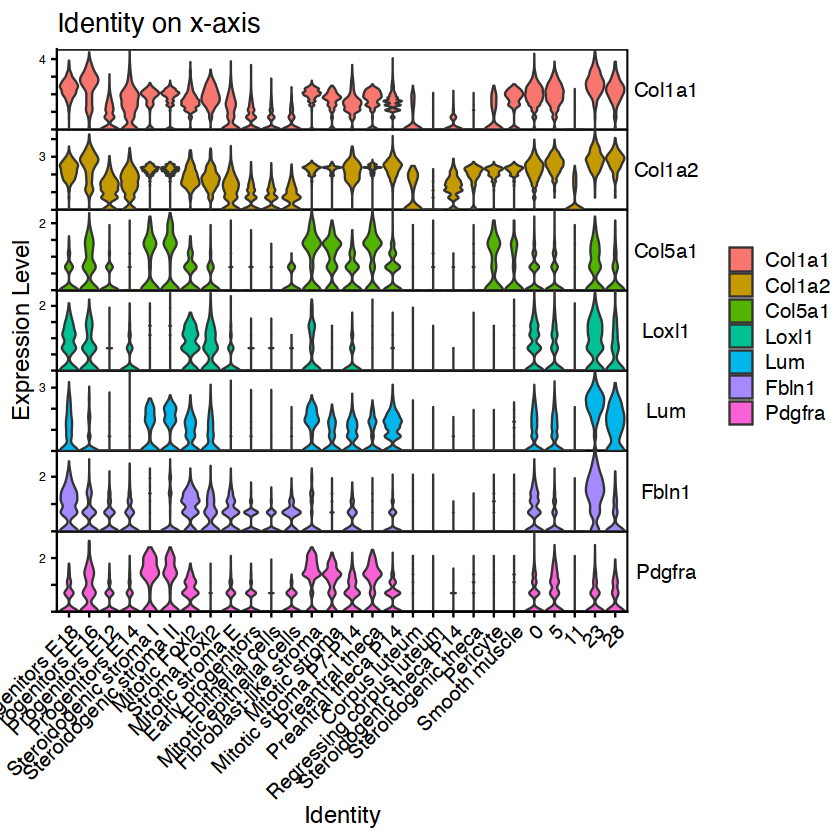

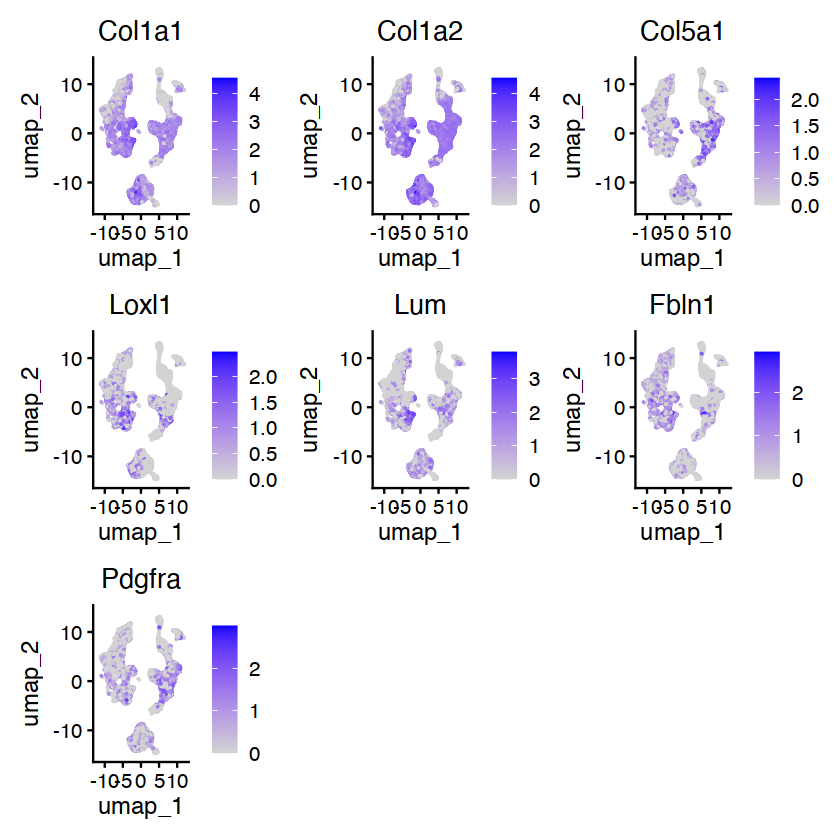

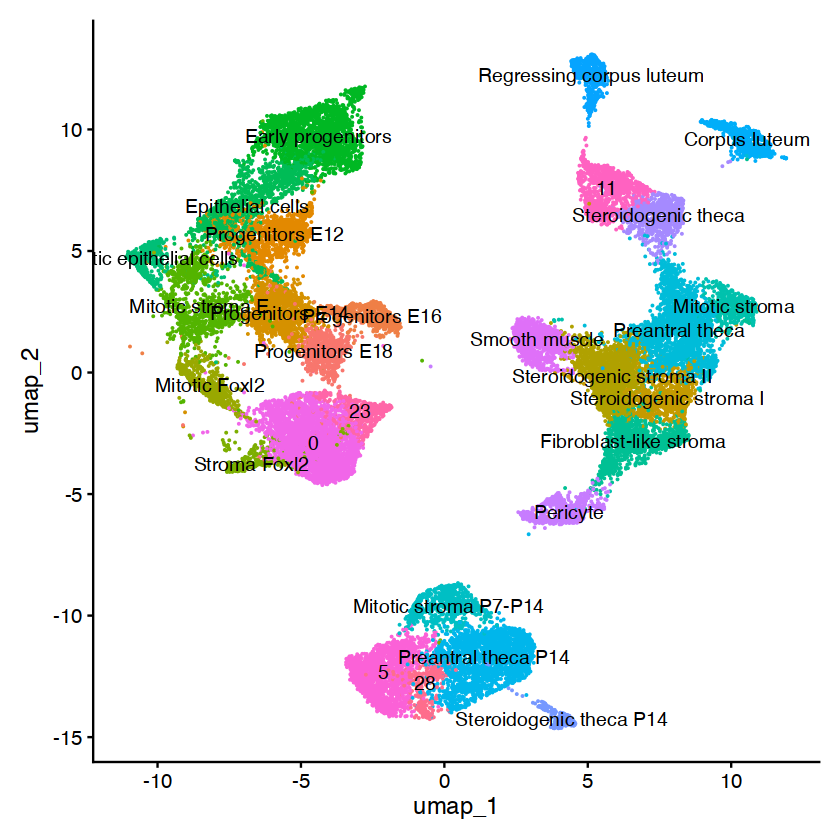

In [61]:
# Fibroblast markers Col1a1, Col1a2, Col5a1, Loxl1, Lum, Fbln1, and Fbln2, 
#as well as the cell surface receptors Cd34 and Pdgfra.

markers = c("Col1a1","Col1a2","Col5a1","Loxl1","Lum","Fbln1","Pdgfra")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers,raster=FALSE)
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()

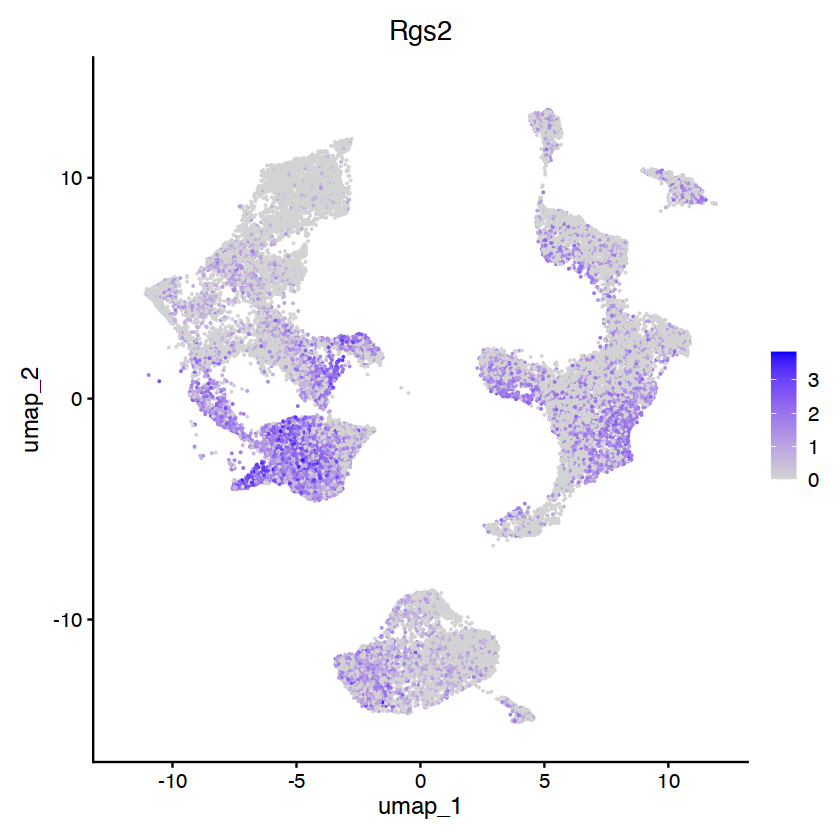

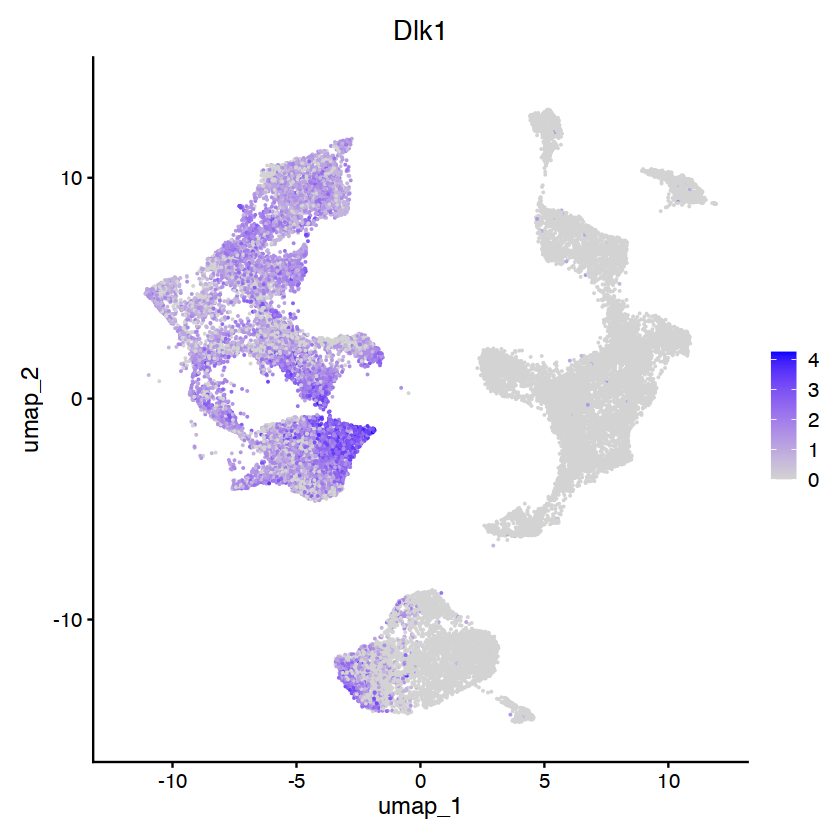

In [97]:
pbmc <- RenameIdents(pbmc, '0' = 'Progenitors Rgs2+','23' = 'Progenitors Dlk1+')
FeaturePlot(pbmc, features = "Rgs2")
FeaturePlot(pbmc, features = "Dlk1") 

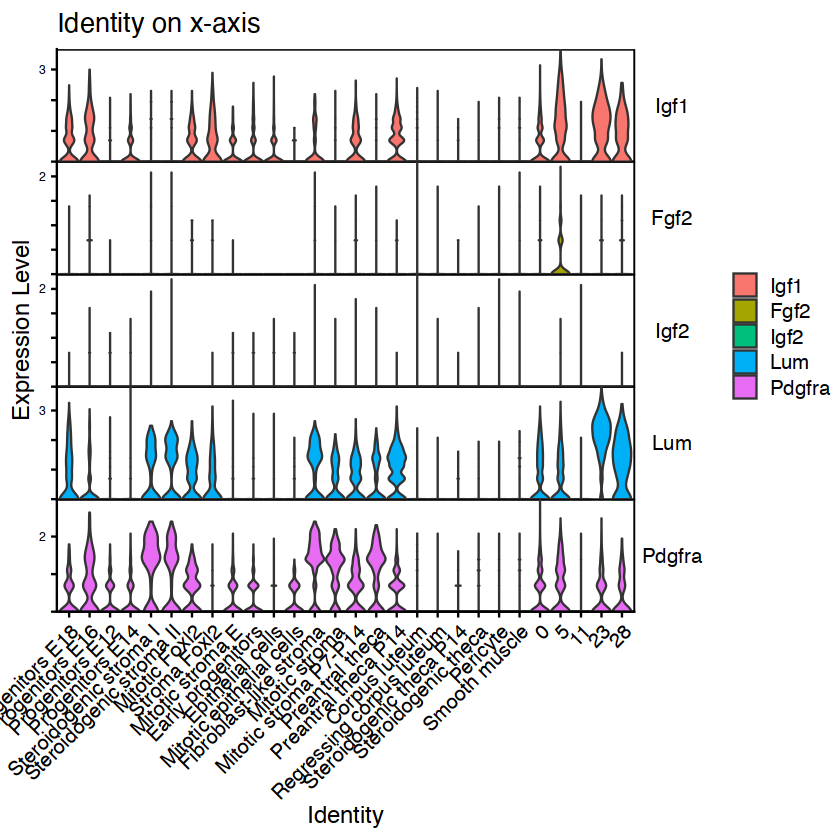

In [84]:
markers = c("Igf1","Fgf2","Igf2","Lum","Pdgfra")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")

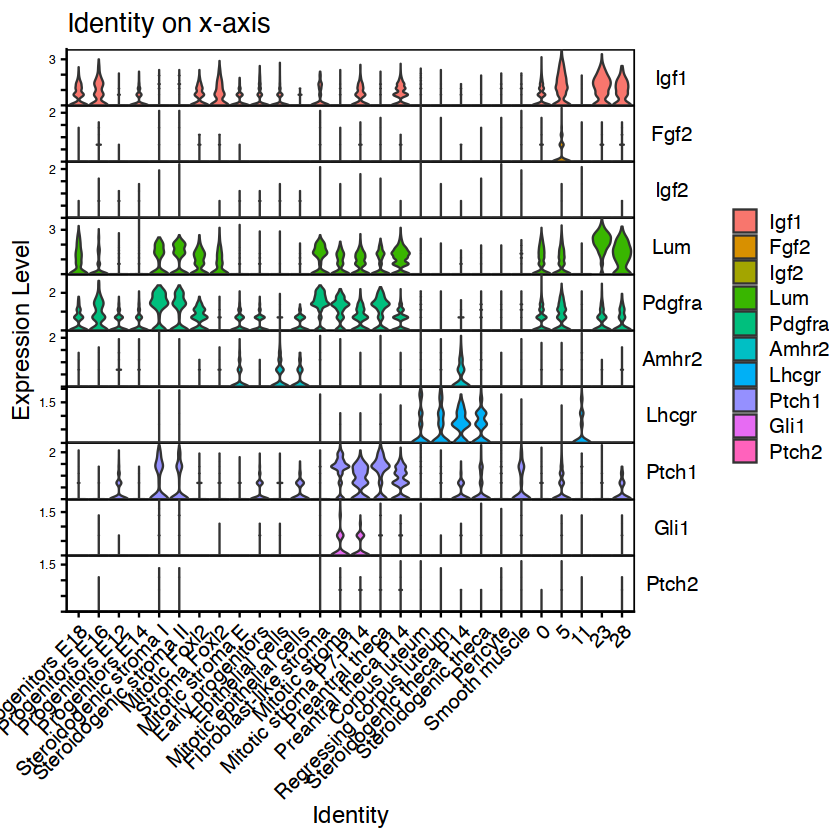

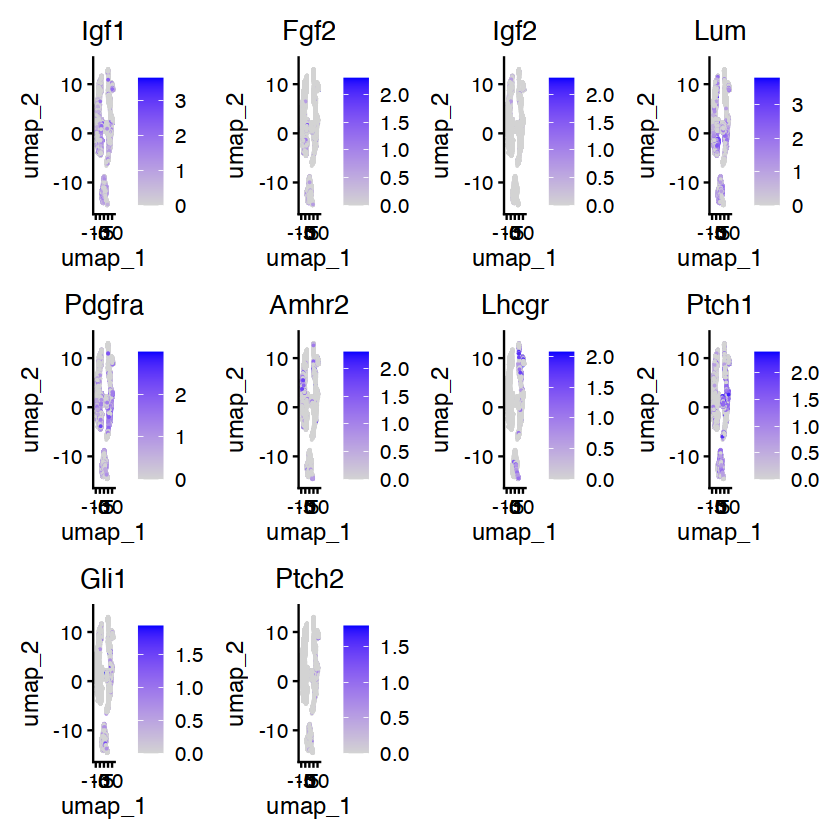

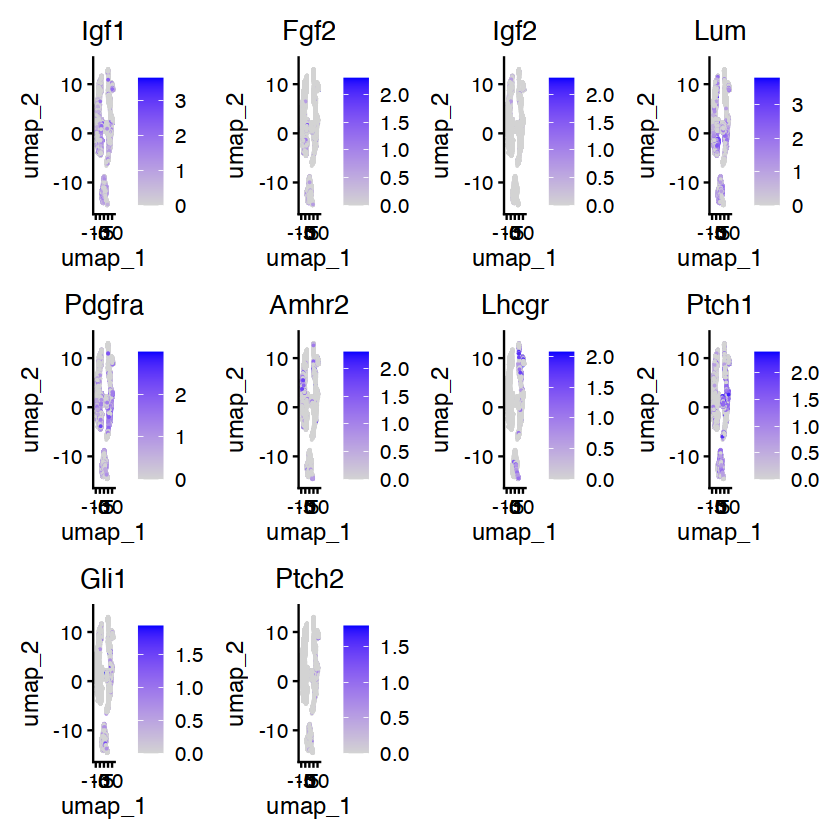

In [91]:

markers = c("Igf1","Fgf2","Igf2","Lum","Pdgfra","Amhr2","Lhcgr","Ptch1","Gli1","Ptch2")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers) 
FeaturePlot(pbmc, features = markers,raster=FALSE)

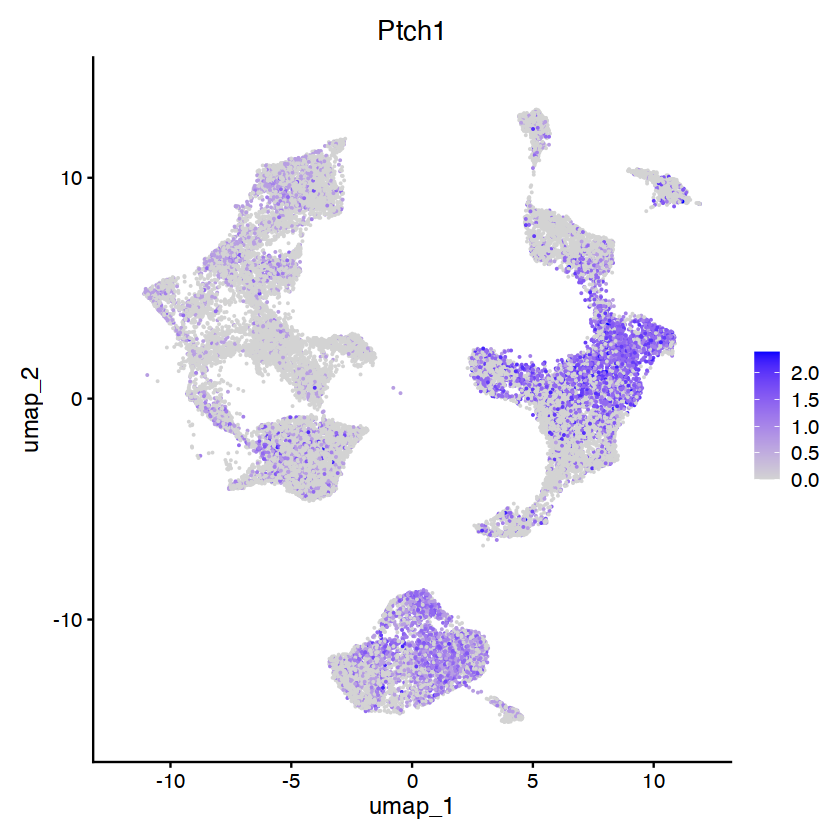

In [89]:
FeaturePlot(pbmc, features = "Ptch1")

In [96]:
# find all markers distinguishing cluster 5 from clusters 0 and 3
cluster5.markers <- FindMarkers(pbmc, ident.1 = 5, min.pct = 0.25)
head(cluster5.markers, n = 10)
up5 <-cluster5.markers[order(-cluster5.markers$avg_log2FC),]
up5 <- up5[up5$avg_log2FC > 0, ]
head(up5, n = 10)
dim(up5)
up5$gene <- row.names(up5)
write.csv(up5,paste("data/up5.csv"), row.names = FALSE)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Btg2,0,1.3469596,0.931,0.476,0
Nenf,0,1.4280350,0.994,0.631,0
Ass1,0,0.5619855,0.375,0.086,0
Serf2,0,0.8146170,0.999,0.986,0
Map1lc3a,0,0.8354589,0.891,0.541,0
Atp5e,0,0.8419233,0.993,0.832,0
Plp1,0,1.1267121,0.433,0.110,0
Gm11808,0,1.0115049,0.827,0.359,0
Eva1b,0,0.9903857,0.930,0.575,0


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Gm10709,0,2.717052,0.999,0.117,0
eGFP,0,2.502247,1.000,0.117,0
Gnb2l1,0,2.458279,0.999,0.117,0
Gm8730,0,2.234438,0.984,0.085,0
Mfap4,0,2.150003,0.993,0.509,0
Sepw1,0,2.147984,0.994,0.207,0
Junb,0,1.911612,0.977,0.461,0
Ier2,0,1.855933,0.982,0.579,0
2700060E02Rik,0,1.727544,0.940,0.107,0


[1] 484   5

In [98]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "5"])



 P07  P14 
1761   30 

In [99]:
# find all markers distinguishing cluster 5 from clusters 0 and 3
cluster5.markers <- FindMarkers(pbmc, ident.1 = 5, indet.2 = "Preantral theca P14", min.pct = 0.25)
head(cluster5.markers, n = 10)
up5 <-cluster5.markers[order(-cluster5.markers$avg_log2FC),]
up5 <- up5[up5$avg_log2FC > 0, ]
head(up5, n = 10)
dim(up5)
up5$gene <- row.names(up5)
write.csv(up5,paste("data/up5.csv"), row.names = FALSE)



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Btg2,0,1.3469596,0.931,0.476,0
Nenf,0,1.4280350,0.994,0.631,0
Ass1,0,0.5619855,0.375,0.086,0
Serf2,0,0.8146170,0.999,0.986,0
Map1lc3a,0,0.8354589,0.891,0.541,0
Atp5e,0,0.8419233,0.993,0.832,0
Plp1,0,1.1267121,0.433,0.110,0
Gm11808,0,1.0115049,0.827,0.359,0
Eva1b,0,0.9903857,0.930,0.575,0


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Gm10709,0,2.717052,0.999,0.117,0
eGFP,0,2.502247,1.000,0.117,0
Gnb2l1,0,2.458279,0.999,0.117,0
Gm8730,0,2.234438,0.984,0.085,0
Mfap4,0,2.150003,0.993,0.509,0
Sepw1,0,2.147984,0.994,0.207,0
Junb,0,1.911612,0.977,0.461,0
Ier2,0,1.855933,0.982,0.579,0
2700060E02Rik,0,1.727544,0.940,0.107,0


[1] 484   5

In [100]:
table(pbmc[["Sample"]]$Sample[ pbmc[["CellType2"]]$CellType2 == "28"])


P07 P14 
 16 290 

In [101]:
pbmc <- RenameIdents(pbmc, '5' = 'Steroidogenic Stroma P14','28' = 'Steroidogenic Stroma P14')


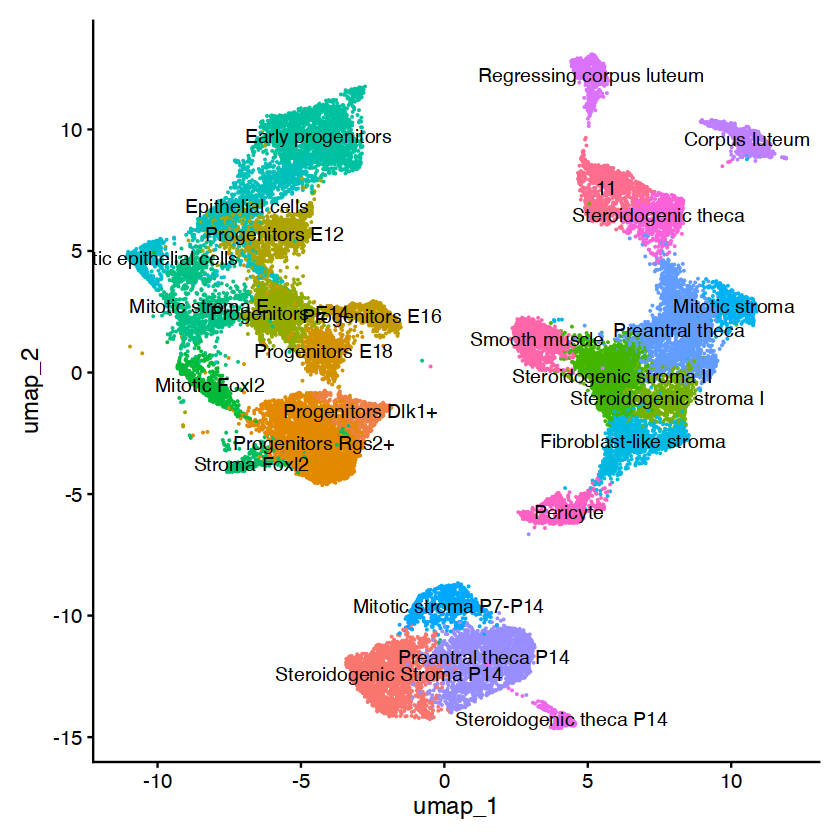

In [102]:
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()

In [103]:
pbmc <- RenameIdents(pbmc, '11' = 'Steroidogenic theca Cyp17a1-')

In [104]:
pbmc[["CellTypesAll"]] <- Idents(object = pbmc)

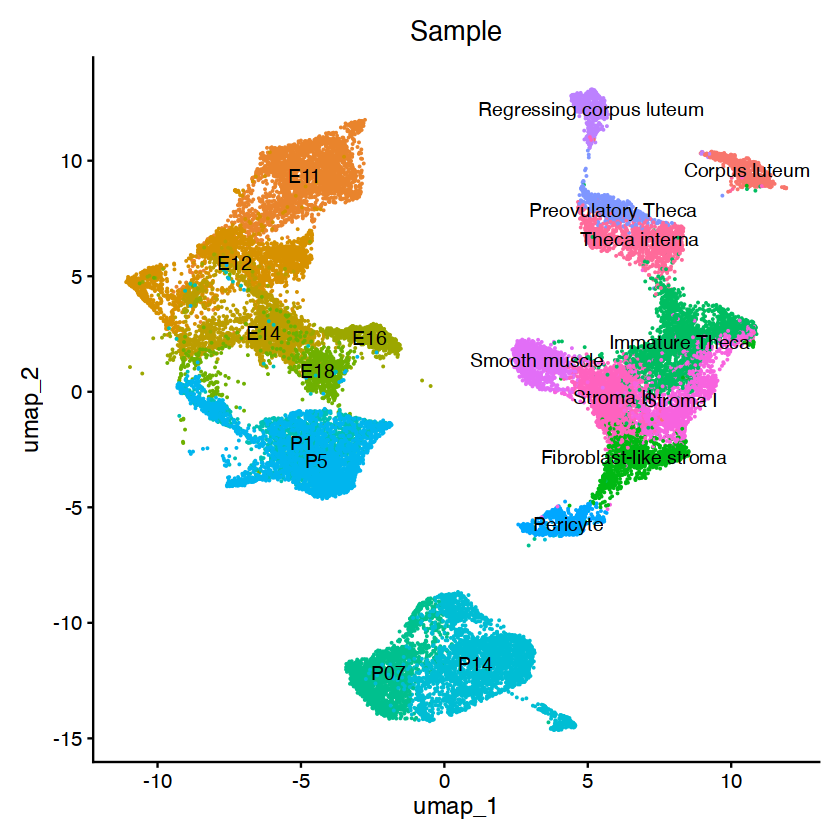

In [108]:
DimPlot(pbmc, reduction = "umap", group.by = "Sample", label = TRUE) + NoLegend()

In [109]:
table( pbmc[["Sample"]])

Sample
           Corpus luteum                      E11                      E12 
                     664                     2952                     2367 
                     E14                      E16                      E18 
                    1903                      664                      917 
  Fibroblast-like stroma           Immature Theca                      P07 
                    1467                     2485                     2041 
                      P1                      P14                       P5 
                    1934                     3120                     2604 
                Pericyte       Preovulatory Theca Regressing corpus luteum 
                     682                      631                      642 
           Smooth muscle                 Stroma I                Stroma II 
                    1070                     1328                     1944 
           Theca interna 
                    1217 

In [110]:
Idents(object = pbmc) <- "Sample"

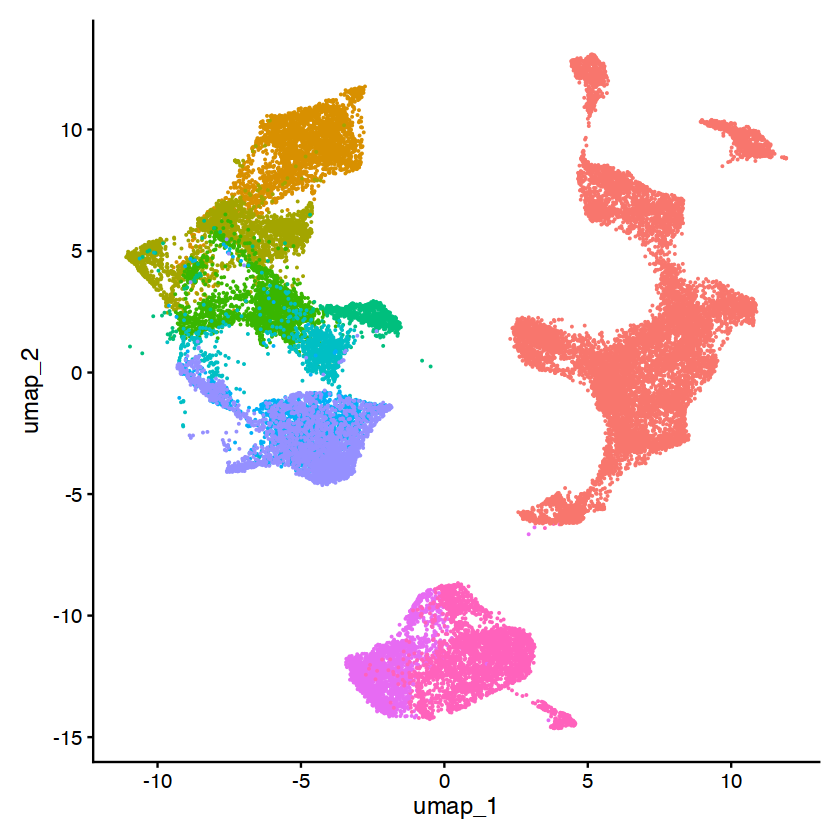

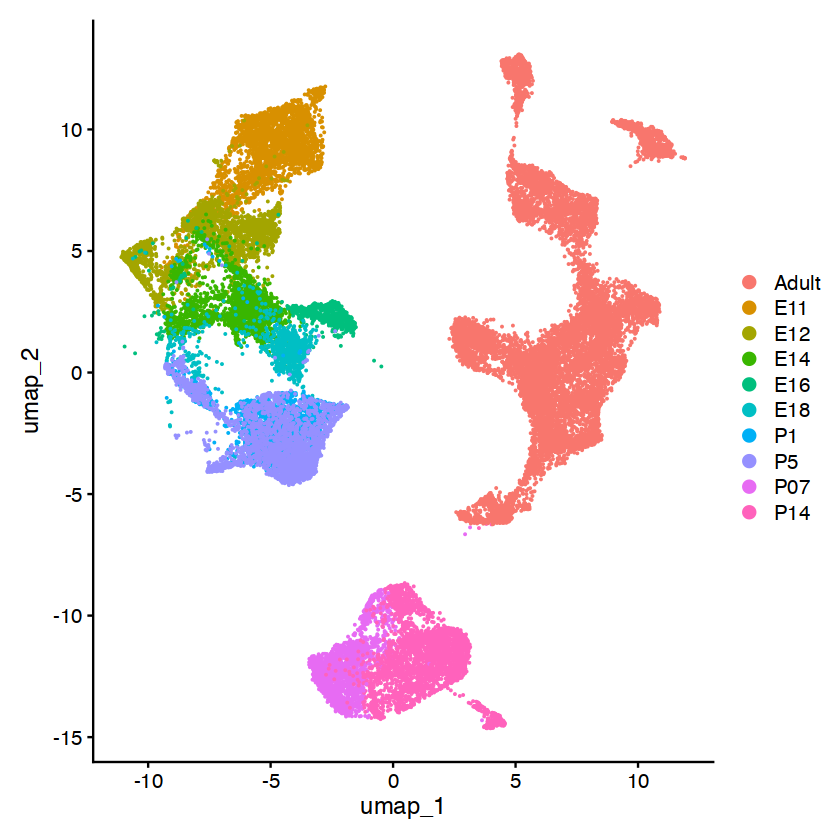

In [115]:
#pbmc <- RenameIdents(pbmc, 'Corpus luteum' = 'Adult', 'Fibroblast-like stroma' = 'Adult', 'Pericyte' = 'Adult',
#                    'Smooth muscle' = 'Adult', 'Theca interna' = 'Adult', 'Immature Theca' = 'Adult',
#                    'Preovulatory Theca' = 'Adult','Stroma I' = 'Adult',
#                     'Stroma II' = 'Adult', 'Regressing corpus luteum' = 'Adult')
DimPlot(pbmc, reduction = "umap") + NoLegend()
DimPlot(pbmc, reduction = "umap") 

In [117]:
pbmc[["SampleAges"]] <- Idents(object = pbmc)
table( pbmc[["SampleAges"]])

SampleAges
Adult   E11   E12   E14   E16   E18    P1    P5   P07   P14 
12130  2952  2367  1903   664   917  1934  2604  2041  3120 

In [119]:
2952 + 2367 +1903 + 664 + 917 + 1934 + 2604 

[1] 13341

In [120]:
2041 + 3120

[1] 5161

In [121]:
 Idents(object = pbmc) <- "CellTypesAll"

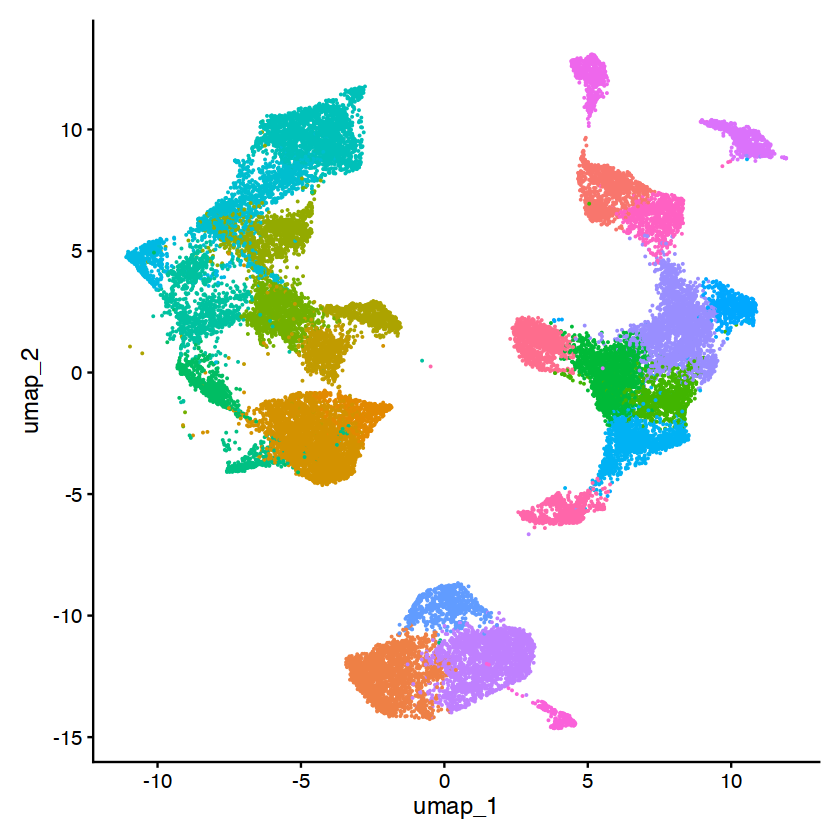

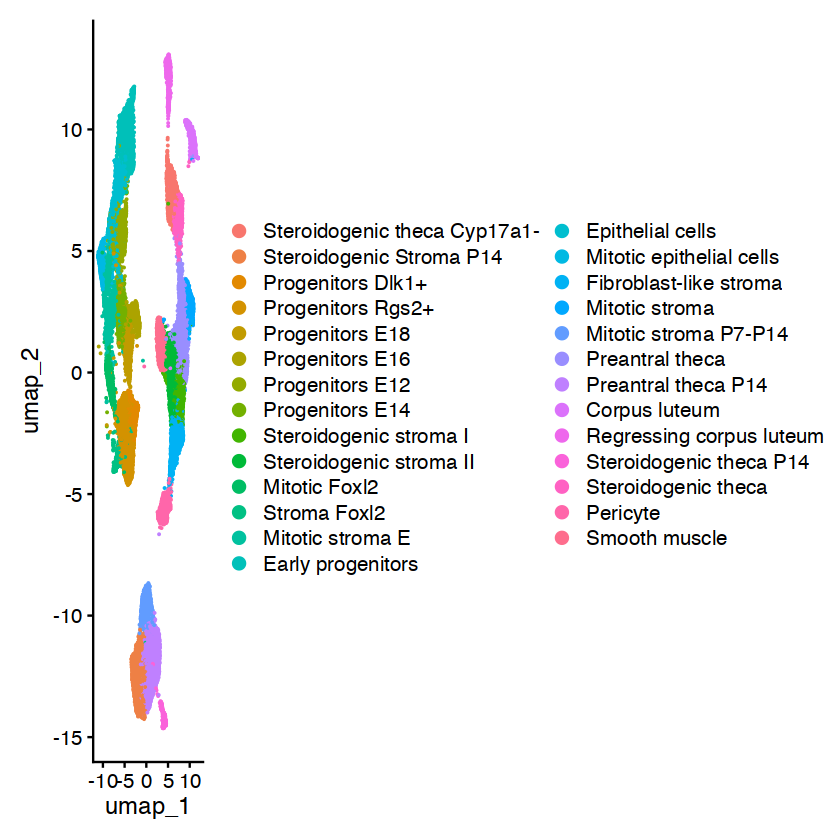

In [122]:
DimPlot(pbmc, reduction = "umap") + NoLegend()
DimPlot(pbmc, reduction = "umap") 

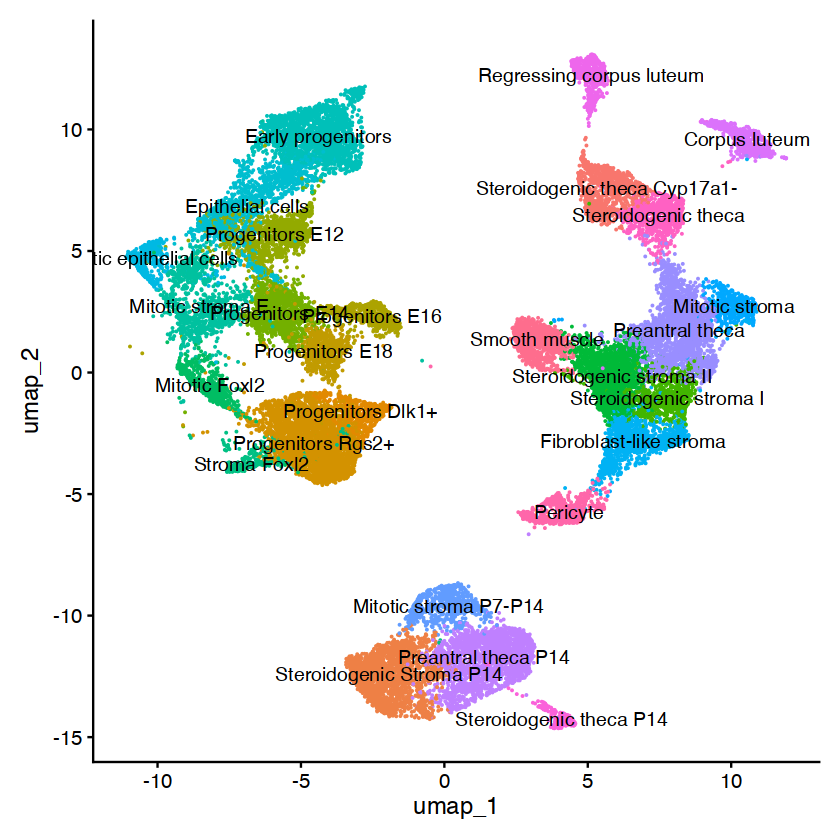

In [124]:
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()

In [127]:
pbmc <- RenameIdents(pbmc, 'Steroidogenic Stroma P14' = 'Steroidogenic Stroma P7')


In [134]:
#Idents(object = pbmc) <- "CellTypesAll"

In [135]:
pbmc[["CellTypesAll"]] <- Idents(object = pbmc)
table( pbmc[["CellTypesAll"]])

CellTypesAll
     Steroidogenic Stroma P7 Steroidogenic theca Cyp17a1- 
                        2097                         1070 
           Progenitors Dlk1+            Progenitors Rgs2+ 
                         530                         3131 
             Progenitors E18              Progenitors E16 
                         730                          603 
             Progenitors E12              Progenitors E14 
                        1228                         1217 
      Steroidogenic stroma I      Steroidogenic stroma II 
                         851                         1899 
               Mitotic Foxl2                 Stroma Foxl2 
                         598                          316 
            Mitotic stroma E            Early progenitors 
                         995                         2190 
            Epithelial cells     Mitotic epithelial cells 
                        1348                          456 
      Fibroblast-like stroma               

In [190]:
pbmc <- RenameIdents(pbmc, 'Stroma Foxl2' = 'Progenitors Foxl2+')

In [200]:
pbmc <- RenameIdents(pbmc, 'Mitotic stroma E' = 'Mitotic epithelial cells')


In [204]:
newLevels = c('Early progenitors',
              'Epithelial cells',
              'Progenitors E12',
              'Progenitors E14',
              'Progenitors E16',
              'Progenitors E18',
              
              'Mitotic epithelial cells',
              'Mitotic Foxl2',
              
              'Progenitors Rgs2+',
              'Progenitors Dlk1+',
              'Progenitors Foxl2+',
              
              'Fibroblast-like stroma',
              "Steroidogenic stroma I",
              "Steroidogenic stroma II",
              'Steroidogenic Stroma P7',
              
              
              "Preantral theca",
              "Preantral theca P14",
              "Steroidogenic theca",
              'Steroidogenic theca P14',
              "Steroidogenic theca Cyp17a1-",
              
              'Corpus luteum',
              'Regressing corpus luteum',
              'Smooth muscle',
              'Pericyte',
              
              'Mitotic stroma',
              'Mitotic stroma P7-P14'
              
              
              
              
              )
Idents(pbmc) <- factor(x = Idents(pbmc), levels = newLevels)

In [231]:
pbmc <- RenameIdents(pbmc, 'Mitotic epithelial cells' = 'Mitotic progenitors')
pbmc <- RenameIdents(pbmc, 'Steroidogenic stroma I' = 'Steroidogenic stroma Klf4')
pbmc <- RenameIdents(pbmc, 'Steroidogenic stroma II' = 'Steroidogenic stroma Ogn')

In [232]:
newLevels = c('Early progenitors',
              'Epithelial cells',
              'Mitotic progenitors',
              'Progenitors E12',
              'Progenitors E14',
              'Progenitors E16',
              'Progenitors E18',
              
              'Mitotic Foxl2',
              
              'Progenitors Rgs2+',
              'Progenitors Dlk1+',
              'Progenitors Foxl2+',
              
              'Fibroblast-like stroma',
              "Steroidogenic stroma Klf4",
              "Steroidogenic stroma Ogn",
              'Steroidogenic Stroma P7',
              
              
              "Preantral theca",
              "Preantral theca P14",
              "Steroidogenic theca",
              'Steroidogenic theca P14',
              "Steroidogenic theca Cyp17a1-",
              
              'Corpus luteum',
              'Regressing corpus luteum',
              'Smooth muscle',
              'Pericyte',
              
              'Mitotic stroma',
              'Mitotic stroma P7-P14'
              
              
              
              
              )
Idents(pbmc) <- factor(x = Idents(pbmc), levels = newLevels)

In [233]:
pbmc[["CellTypesAll"]] <- Idents(object = pbmc)

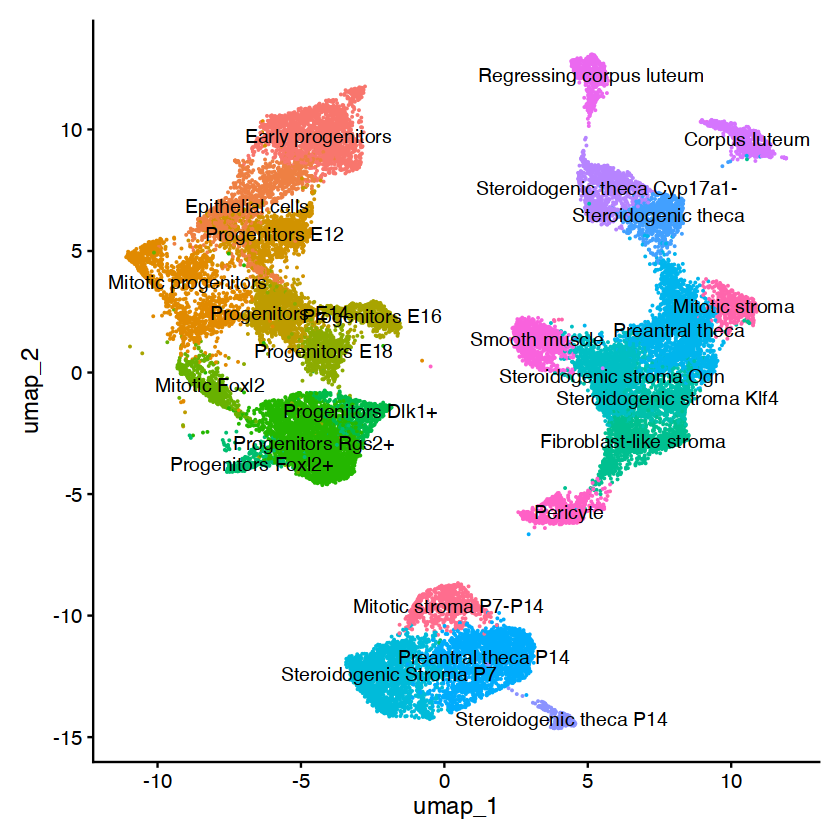

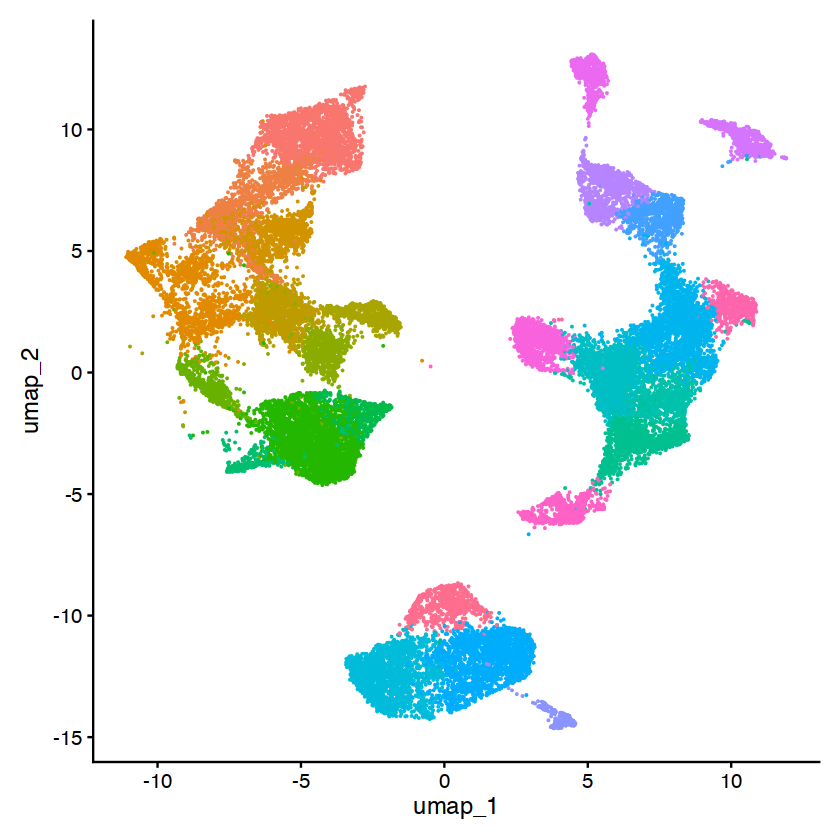

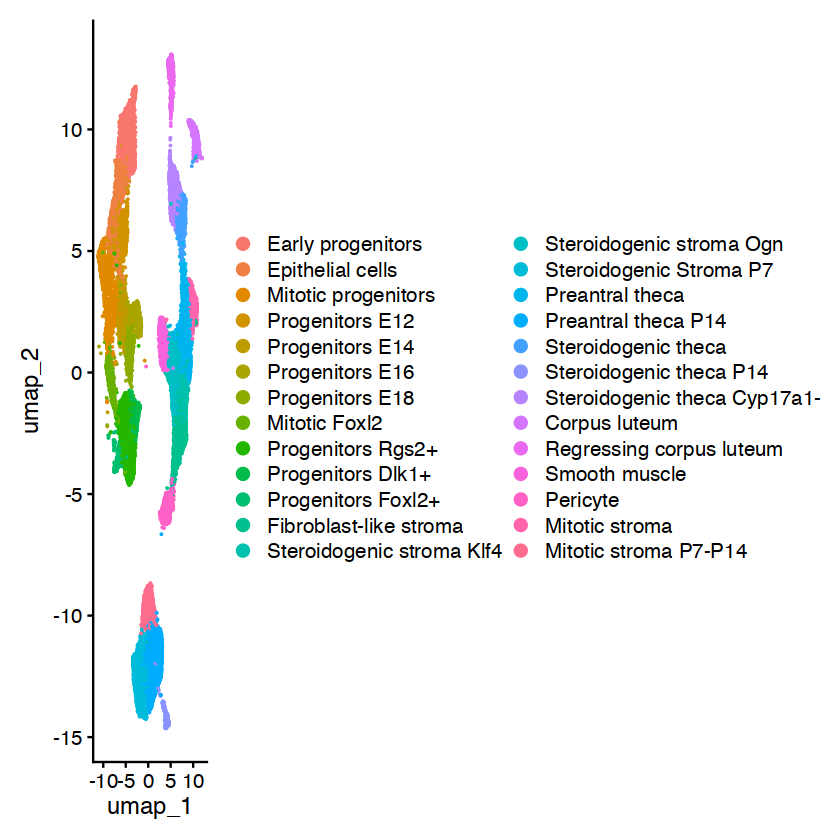

In [254]:
DimPlot(pbmc, reduction = "umap", label = TRUE) + NoLegend()
DimPlot(pbmc, reduction = "umap") + NoLegend()
DimPlot(pbmc, reduction = "umap") 

In [6]:
library(dittoSeq)

In [197]:
pbmc[["CellTypesAll"]] <- Idents(object = pbmc)

In [244]:
cluster5.markers <- FindMarkers(pbmc, ident.1 = "Steroidogenic stroma Ogn", indet.2 = "Steroidogenic stroma Klf4", min.pct = 0.25)

In [250]:
up5 <-cluster5.markers[order(-cluster5.markers$avg_log2FC),]
up5 <- up5[up5$avg_log2FC > 0, ]
up5 <- up5[up5$pct.1 > 0.8, ]
head(up5, n = 10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Ogn,0.000000e+00,1.5603236,0.879,0.308,0.000000e+00
Gm17541,0.000000e+00,1.3256818,0.896,0.291,0.000000e+00
Cfh,0.000000e+00,1.2649630,0.913,0.455,0.000000e+00
Sulf2,0.000000e+00,1.0603148,0.831,0.550,0.000000e+00
Gstm1,1.858423e-206,0.6958967,0.808,0.604,2.067310e-202
Psap,6.424503e-249,0.6594676,0.872,0.778,7.146617e-245
Wbp5,1.720195e-228,0.6525630,0.880,0.499,1.913545e-224
Sparcl1,3.561959e-178,0.6308024,0.806,0.617,3.962323e-174
Pabpc1,1.052096e-257,0.5152840,0.983,0.952,1.170352e-253


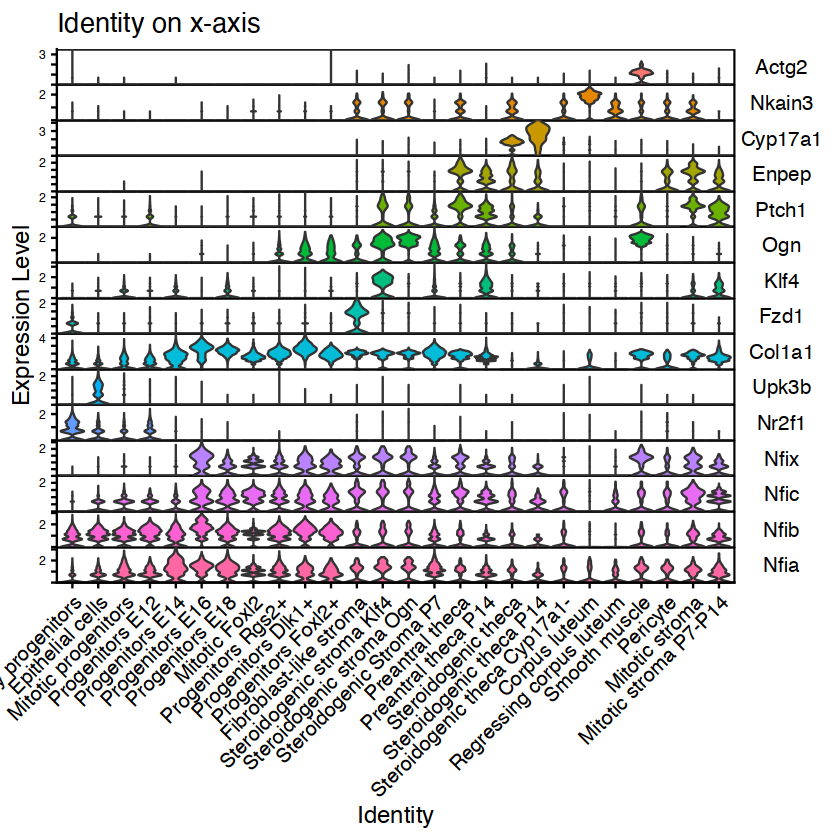

In [253]:
#Cyp1b1
markersAll = c(
              "Nfia","Nfib","Nfic","Nfix","Nr2f1","Upk3b","Col1a1","Fzd1","Klf4","Ogn","Ptch1","Enpep","Cyp17a1","Nkain3","Actg2"
              )
markersAll = rev(markersAll)
VlnPlot(pbmc, markersAll,  stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "none") + ggtitle("Identity on x-axis")

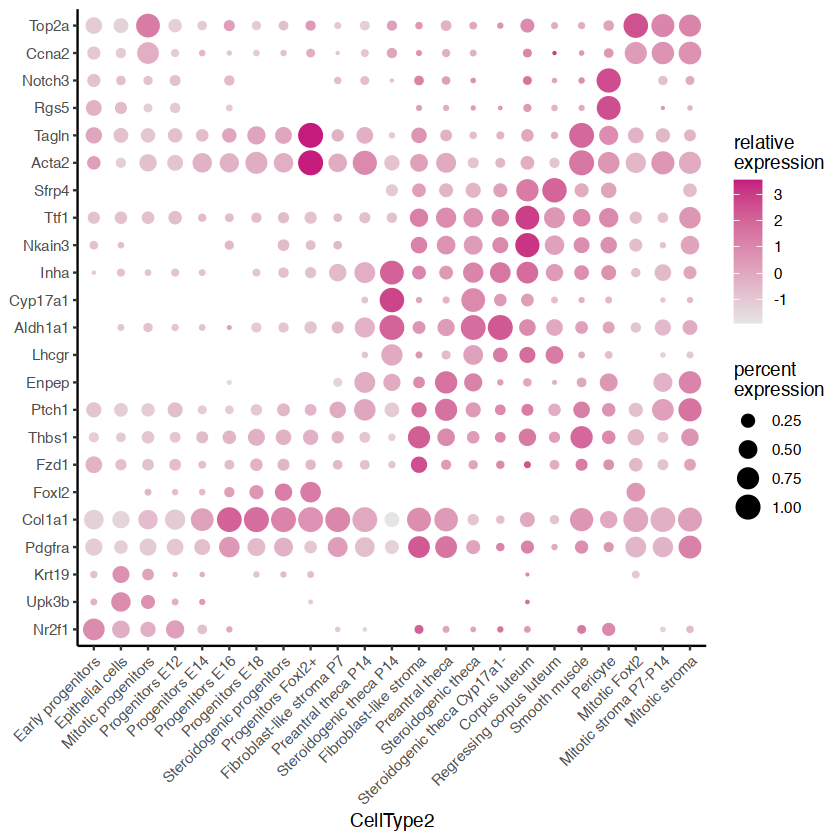

In [69]:
markers <- c(
#Early stroma progenitors
"Nr2f1",
# epithelial cells
"Upk3b","Krt19",  
#Embrio stroma progenitors
"Pdgfra","Col1a1",
#Progenitors
"Foxl2",
#Fibroblast-like stroma
"Fzd1","Thbs1",
#Steroidogenic Stroma
"Ptch1",
#Preantral theca
"Enpep","Lhcgr",
#Atral steroidogenic theca
"Aldh1a1","Cyp17a1",
#Atretic CL  Active 
"Inha",
#CL reg CL atretic follicles show high levels of SELK"Selk","Efhd1","Star",
"Nkain3", "Ttf1", "Sfrp4",
    
#Smooth muscle
"Acta2","Tagln", 
#Pericyte
"Rgs5","Notch3",
    

# Mitotic Ccna2
"Ccna2","Top2a"
)
#markers <- rev(markers)
dittoDotPlot(pbmc, markers, group.by = "CellType2") + coord_flip()


In [70]:
as.data.frame( rev(markers))

rev(markers)
<chr>
Top2a
Ccna2
Notch3
Rgs5
Tagln
Acta2
Sfrp4
Ttf1
Nkain3


In [189]:
as.data.frame(as.data.frame( table(pbmc[["CellTypesAll"]]))$CellTypesAll)

"as.data.frame(table(pbmc[[""CellTypesAll""]]))$CellTypesAll"
<fct>
Early progenitors
Progenitors E12
Progenitors E14
Progenitors E16
Progenitors E18
Progenitors Rgs2+
Progenitors Dlk1+
Mitotic stroma P7-P14
Steroidogenic Stroma P7


In [210]:
# find markers for every cluster compared to all remaining cells, report only the positive 
# ones
pbmc.markers <- FindAllMarkers(pbmc, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
pbmc.markers %>%
    group_by(cluster) %>%
    slice_max(n = 2, order_by = avg_log2FC)  

Calculating cluster Early progenitors

Calculating cluster Epithelial cells

Calculating cluster Progenitors E12

Calculating cluster Progenitors E14

Calculating cluster Progenitors E16

Calculating cluster Progenitors E18

Calculating cluster Mitotic epithelial cells

Calculating cluster Mitotic Foxl2

Calculating cluster Progenitors Rgs2+

Calculating cluster Progenitors Dlk1+

Calculating cluster Progenitors Foxl2+

Calculating cluster Fibroblast-like stroma

Calculating cluster Steroidogenic stroma I

Calculating cluster Steroidogenic stroma II

Calculating cluster Steroidogenic Stroma P7

Calculating cluster Preantral theca

Calculating cluster Preantral theca P14

Calculating cluster Steroidogenic theca

Calculating cluster Steroidogenic theca P14

Calculating cluster Steroidogenic theca Cyp17a1-

Calculating cluster Corpus luteum

Calculating cluster Regressing corpus luteum

Calculating cluster Smooth muscle

Calculating cluster Pericyte

Calculating cluster Mitotic stroma

Ca

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.206381,0.987,0.185,0.000000e+00,Early progenitors,Hmga2
0.000000e+00,2.178400,0.994,0.395,0.000000e+00,Early progenitors,Cdkn1c
0.000000e+00,1.835793,0.964,0.209,0.000000e+00,Epithelial cells,Hmga2
0.000000e+00,1.545319,0.950,0.168,0.000000e+00,Epithelial cells,Hbb-y
0.000000e+00,1.740448,0.966,0.170,0.000000e+00,Progenitors E12,Hbb-y
0.000000e+00,1.400791,0.963,0.213,0.000000e+00,Progenitors E12,Hmga2
0.000000e+00,1.651623,1.000,1.000,0.000000e+00,Progenitors E14,Actb
0.000000e+00,1.431718,1.000,0.993,0.000000e+00,Progenitors E14,Tmsb10
0.000000e+00,3.363366,1.000,0.454,0.000000e+00,Progenitors E16,Igfbp5


In [211]:
pbmc.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.206381,0.987,0.185,0.000000e+00,Early progenitors,Hmga2
0.000000e+00,2.178400,0.994,0.395,0.000000e+00,Early progenitors,Cdkn1c
0.000000e+00,1.661505,0.984,0.366,0.000000e+00,Early progenitors,Mest
0.000000e+00,1.560755,0.993,0.141,0.000000e+00,Early progenitors,Hbb-y
0.000000e+00,1.557361,0.964,0.267,0.000000e+00,Early progenitors,Sox11
0.000000e+00,1.835793,0.964,0.209,0.000000e+00,Epithelial cells,Hmga2
0.000000e+00,1.545319,0.950,0.168,0.000000e+00,Epithelial cells,Hbb-y
0.000000e+00,1.279733,0.697,0.143,0.000000e+00,Epithelial cells,Igfbp2
0.000000e+00,1.218396,0.987,0.477,0.000000e+00,Epithelial cells,Peg3


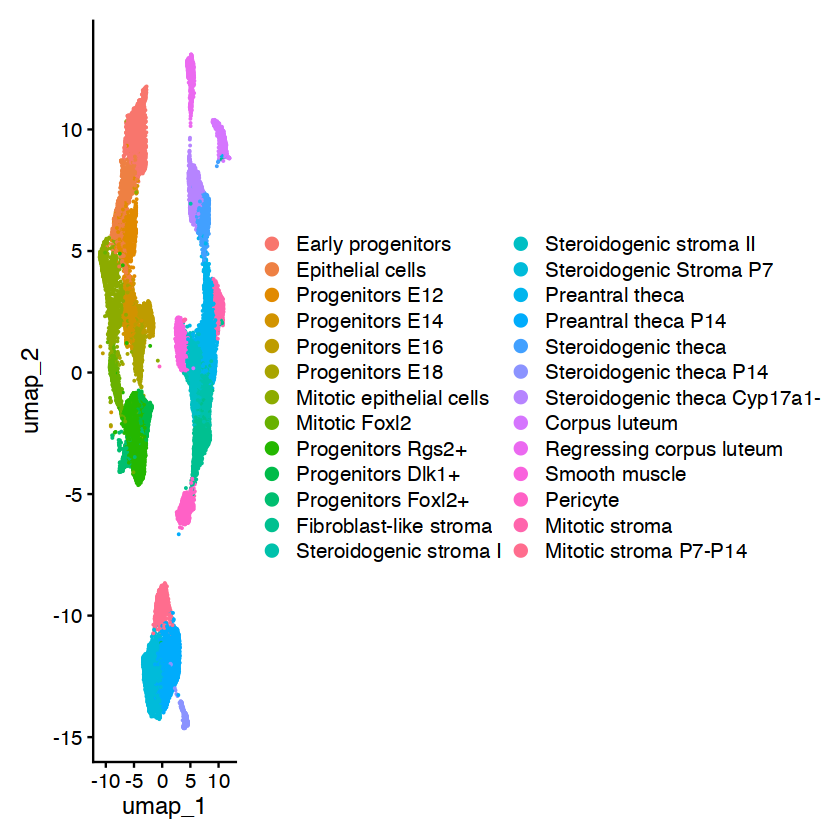

In [13]:
DimPlot(pbmc, reduction = "umap")

In [12]:
#save(pbmc, file="data/MesenchymeAll-Named.Rdata")
load("data/MesenchymeAll-Named.Rdata")

In [221]:
table(pbmc[["CellTypesAll"]])

CellTypesAll
           Early progenitors             Epithelial cells 
                        2190                         1348 
             Progenitors E12              Progenitors E14 
                        1228                         1217 
             Progenitors E16              Progenitors E18 
                         603                          730 
    Mitotic epithelial cells                Mitotic Foxl2 
                        1451                          598 
           Progenitors Rgs2+            Progenitors Dlk1+ 
                        3131                          530 
          Progenitors Foxl2+       Fibroblast-like stroma 
                         316                         1513 
      Steroidogenic stroma I      Steroidogenic stroma II 
                         851                         1899 
     Steroidogenic Stroma P7              Preantral theca 
                        2097                         2358 
         Preantral theca P14          Stero

In [222]:
 table(pbmc[["Sample"]]$Sample[ pbmc[["CellTypesAll"]]$CellTypesAll == "Early progenitors"])


 E11  E12 
2184    6 

In [223]:
 table(pbmc[["Sample"]]$Sample[ pbmc[["CellTypesAll"]]$CellTypesAll == "Progenitors E12"])


 E11  E12  E14  E16  E18   P1   P5 
   9 1153   52    7    3    3    1 

In [224]:
 table(pbmc[["Sample"]]$Sample[ pbmc[["CellTypesAll"]]$CellTypesAll == "Epithelial cells"])



E11 E12 E14 E16 E18  P1 
698 504 140   2   2   2 

In [ ]:
pbmc <- RenameIdents(pbmc, '15' = 'Progenitors E11', '11' = 'Progenitors E11',
                            '8' = 'Progenitors E11', 
                             '1' = 'Progenitors','5' = 'Progenitors E', 
                             '6' = 'Progenitors E','10' = 'Progenitors E',
                             '13' = 'Progenitors E', '31' = 'Progenitors E',
                             '16' = 'Progenitors E','19' = 'Progenitors E',
                             '21' = 'Progenitors', 
                             '22' = 'Progenitors E','23' = 'Progenitors',
                             '25' = 'Progenitors', 
                             '26' = 'Progenitors E','27' = 'Progenitors E',
                     '29' = 'Progenitors E'
                            )

In [ ]:
#Pdgfra, Col1a1, and Tcf21 Star, Cyp11a1, and Cyp17a1 Hsd3b2 
markers = c("Nr2f1","Pdgfra","Col1a1","Tcf21","Star","Cyp11a1","Cyp17a1","Hsd3b2")

VlnPlot(pbmc, markers,   stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "right") + ggtitle("Identity on x-axis")
FeaturePlot(pbmc, features = markers) 
FeaturePlot(pbmc, features = markers,raster=FALSE)

In [257]:
pbmc[["CellType2"]] <- Idents(object = pbmc)

In [258]:
save(pbmc, file="data/morris-niu-Mesenchyme.Rdata")


In [1]:
load("data/morris-niu-Mesenchyme.Rdata")

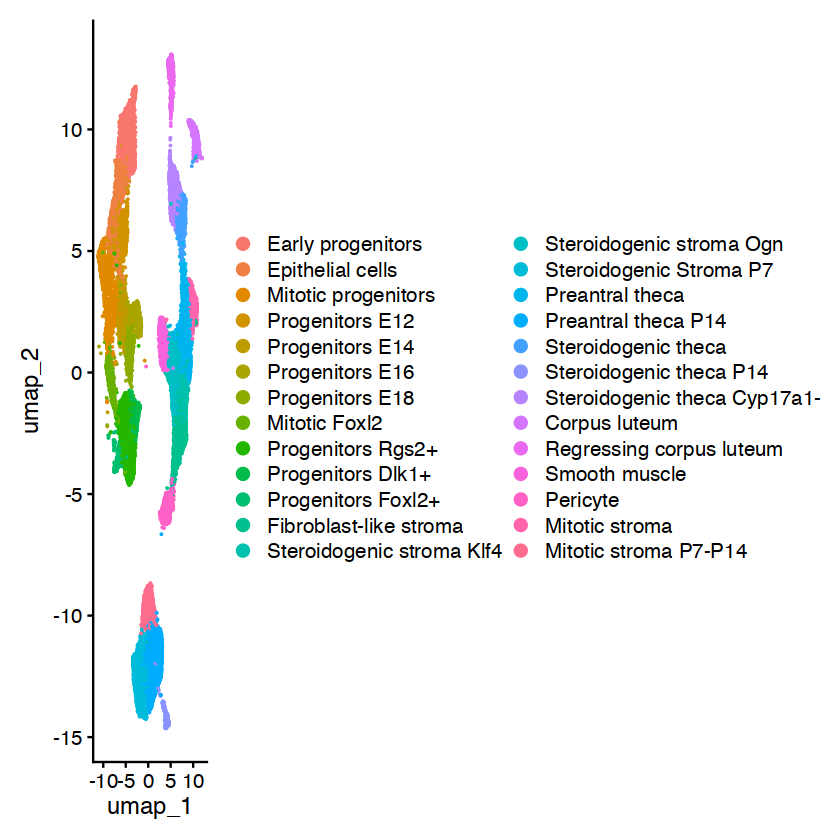

In [3]:
DimPlot(pbmc,reduction = "umap")

In [8]:
table(pbmc[["CellType2"]])

CellType2
           Early progenitors             Epithelial cells 
                        2190                         1348 
         Mitotic progenitors              Progenitors E12 
                        1451                         1228 
             Progenitors E14              Progenitors E16 
                        1217                          603 
             Progenitors E18                Mitotic Foxl2 
                         730                          598 
           Progenitors Rgs2+            Progenitors Dlk1+ 
                        3131                          530 
          Progenitors Foxl2+       Fibroblast-like stroma 
                         316                         1513 
   Steroidogenic stroma Klf4     Steroidogenic stroma Ogn 
                         851                         1899 
     Steroidogenic Stroma P7              Preantral theca 
                        2097                         2358 
         Preantral theca P14          Steroido

In [6]:
Idents(object = pbmc) <- "CellType2"

In [9]:
pbmc <- RenameIdents(pbmc, 'Steroidogenic stroma Ogn' = 'Fibroblast-like stroma', 
                            'Steroidogenic stroma Klf4' = 'Fibroblast-like stroma'
                            )

In [17]:
pbmc <- RenameIdents(pbmc, 'Progenitors Rgs2+' = 'Steroidogenic progenitors', 
                            'Progenitors Dlk1+' = 'Steroidogenic progenitors'
                            )

In [28]:

pbmc <- RenameIdents(pbmc, 'Steroidogenic Stroma P7' = 'Fibroblast-like stroma P7'
                            )

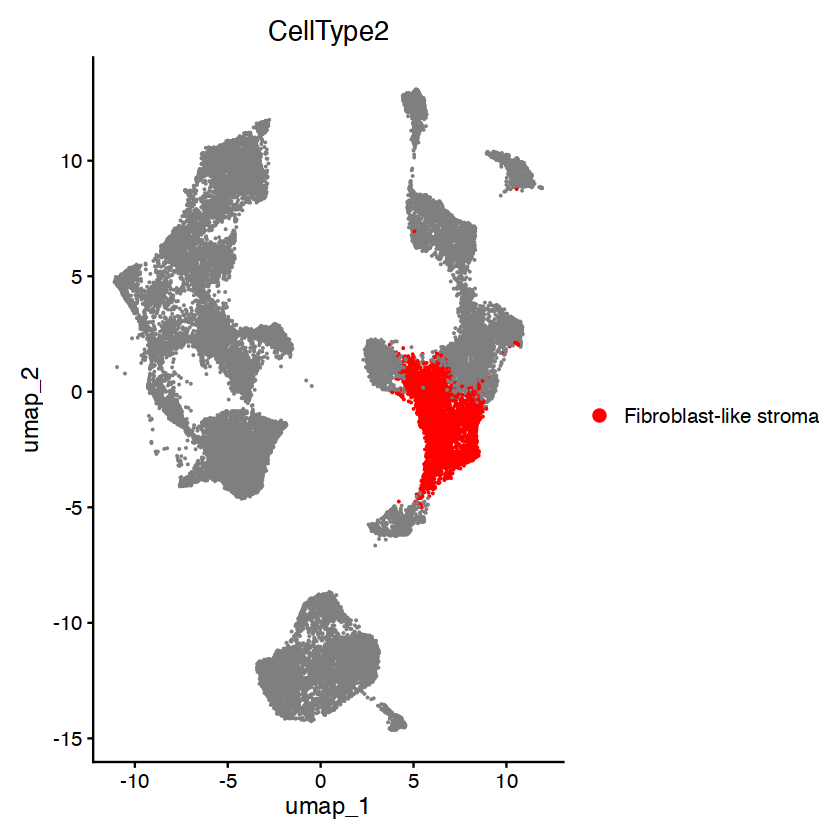

In [45]:
DimPlot(object = pbmc, reduction = 'umap', group.by = 'CellType2', 
        cols = c('Fibroblast-like stroma' = 'red'))

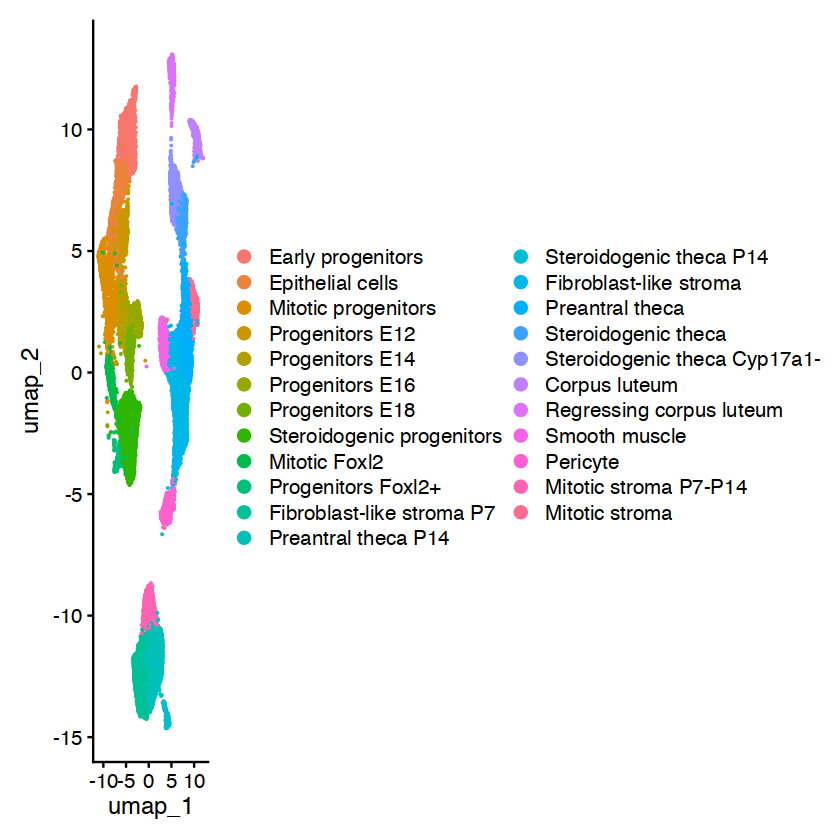

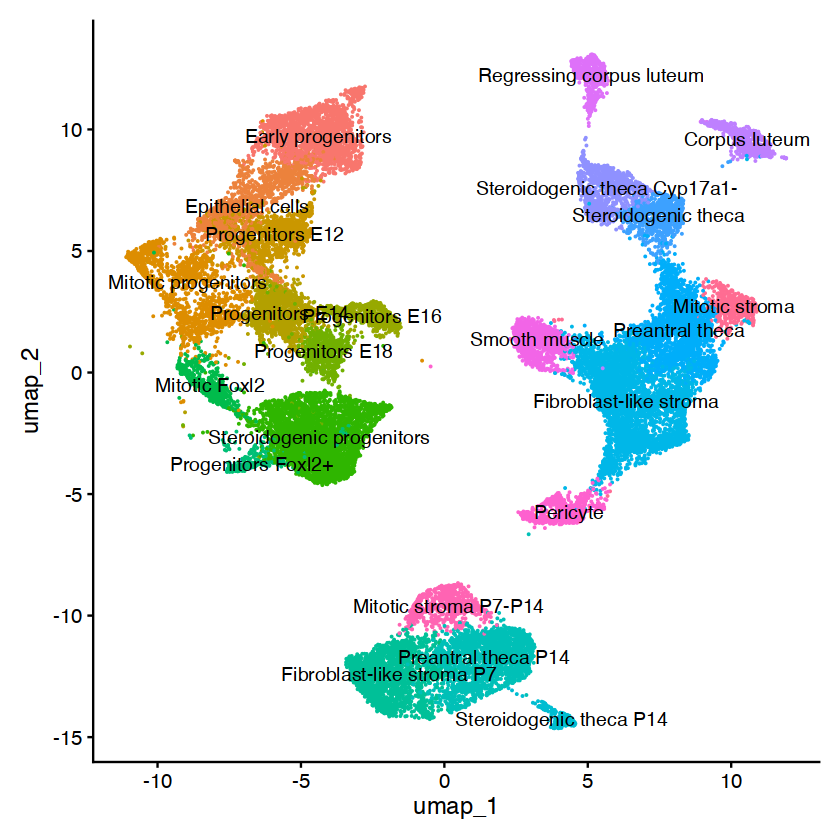

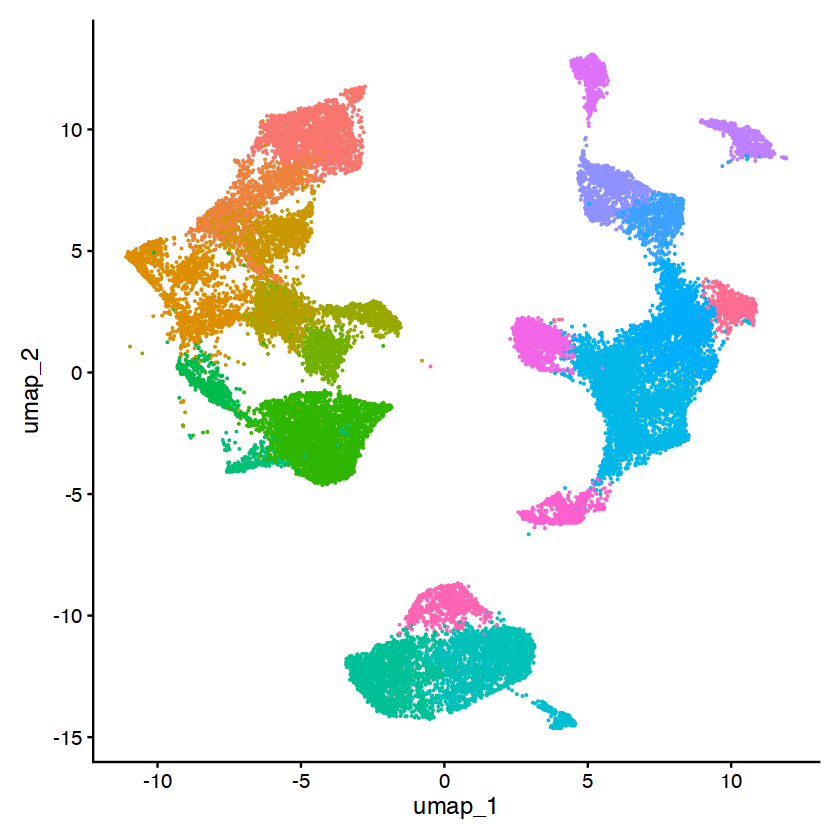

In [60]:
DimPlot(pbmc,reduction = "umap")
DimPlot(pbmc,reduction = "umap", label = TRUE)+ NoLegend()
DimPlot(pbmc,reduction = "umap") + NoLegend()

In [8]:
table(pbmc[["CellType2"]])

CellType2
           Early progenitors             Epithelial cells 
                        2190                         1348 
         Mitotic progenitors              Progenitors E12 
                        1451                         1228 
             Progenitors E14              Progenitors E16 
                        1217                          603 
             Progenitors E18    Steroidogenic progenitors 
                         730                         3661 
          Progenitors Foxl2+    Fibroblast-like stroma P7 
                         316                         2097 
         Preantral theca P14      Steroidogenic theca P14 
                        2125                          270 
      Fibroblast-like stroma              Preantral theca 
                        4263                         2358 
         Steroidogenic theca Steroidogenic theca Cyp17a1- 
                         779                         1070 
               Corpus luteum     Regressing co

In [19]:
pbmc <- RenameIdents(pbmc, 'Progenitors Foxl2+' = 'Early smooth muscle', 
                            'Steroidogenic theca Cyp17a1-' = 'Small luteal cells'
                            )

In [20]:
pbmc[["CellType2"]] <- Idents(object = pbmc)

In [21]:
colors = c('Early progenitors'='#F68282',
              'Epithelial cells'='#31C53F',
              'Mitotic progenitors'='#1FA195',
              'Progenitors E12'='#B95FBB',
              'Progenitors E14'='#D4D915',
              'Progenitors E16'='#28CECA',
              'Progenitors E18'='#ff9a36',
              'Steroidogenic progenitors'='#2FF18B',
              

              'Early smooth muscle'='#998675',
              
              
              'Fibroblast-like stroma P7'='#CCB1F1',
              "Preantral theca P14"='#25aff5',
              'Steroidogenic theca P14'='#A4DFF2',
              
              'Fibroblast-like stroma'='#4B4BF7',
              "Preantral theca"='#AC8F14',
              "Steroidogenic theca"='#E6C122',
              "Small luteal cells" = '#F69679',
              
              'Corpus luteum'='#FFF799',
              'Regressing corpus luteum'='#7ACCC8',
              
              'Smooth muscle'='#8393CA',
              'Pericyte'='#F49AC1',
              
              'Mitotic Foxl2'='#AEADB3',
              'Mitotic stroma P7-P14'='#197B30',
              'Mitotic stroma'='#9E005D'
              
              
              
              
              
              )


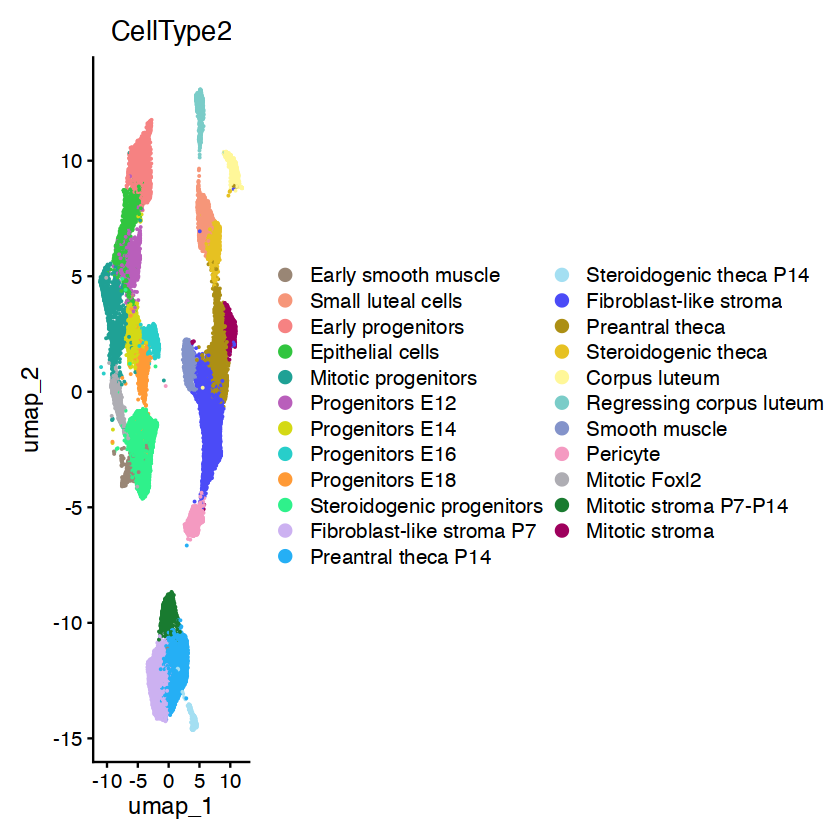

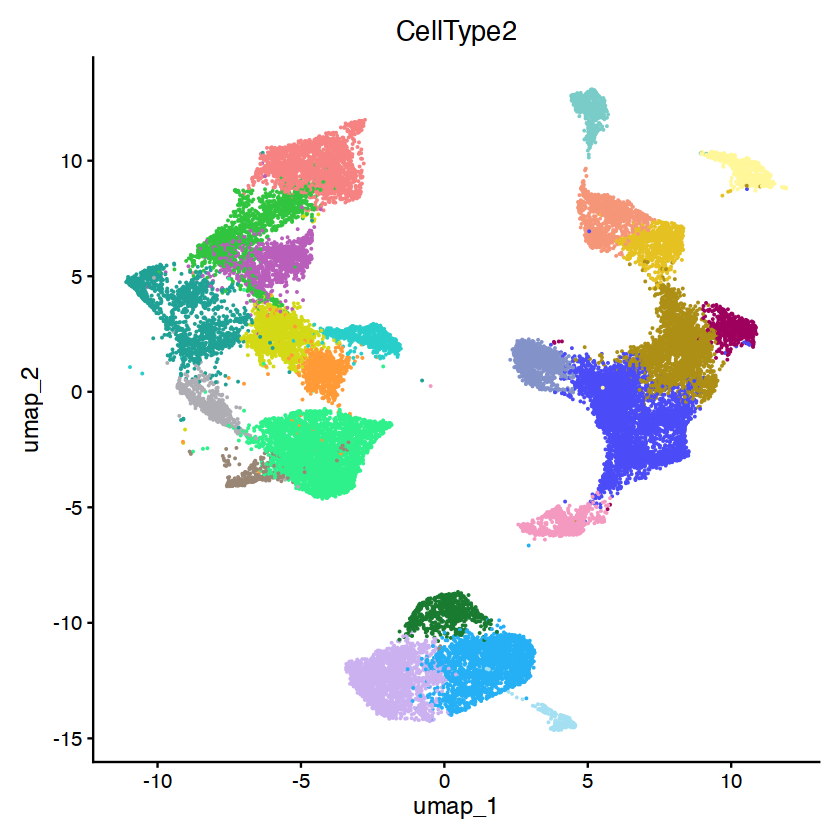

In [22]:
DimPlot(pbmc, group.by = "CellType2",cols = colors)
DimPlot(pbmc, group.by = "CellType2",cols = colors) +NoLegend()

In [23]:
newLevels = c('Early progenitors',
              'Epithelial cells',
              'Mitotic progenitors',
              'Progenitors E12',
              'Progenitors E14',
              'Progenitors E16',
              'Progenitors E18',
              'Steroidogenic progenitors',
              
              
              'Early smooth muscle',
              
              
              'Fibroblast-like stroma P7',
              "Preantral theca P14",
              'Steroidogenic theca P14',
              
              'Fibroblast-like stroma',
              "Preantral theca",
              "Steroidogenic theca",
              "Small luteal cells",
              
              'Corpus luteum',
              'Regressing corpus luteum',
              
              'Smooth muscle',
              'Pericyte',
              
              'Mitotic Foxl2',
              'Mitotic stroma P7-P14',
              'Mitotic stroma'
              
              
              
              
              
              )
Idents(pbmc) <- factor(x = Idents(pbmc), levels = newLevels)

In [24]:
pbmc[["CellType2"]] <- Idents(object = pbmc)

In [3]:
save(pbmc, file="data/morris-niu-Mesenchyme-2.Rdata")
#load("data/morris-niu-Mesenchyme-2.Rdata")

In [ ]:
########## ####################

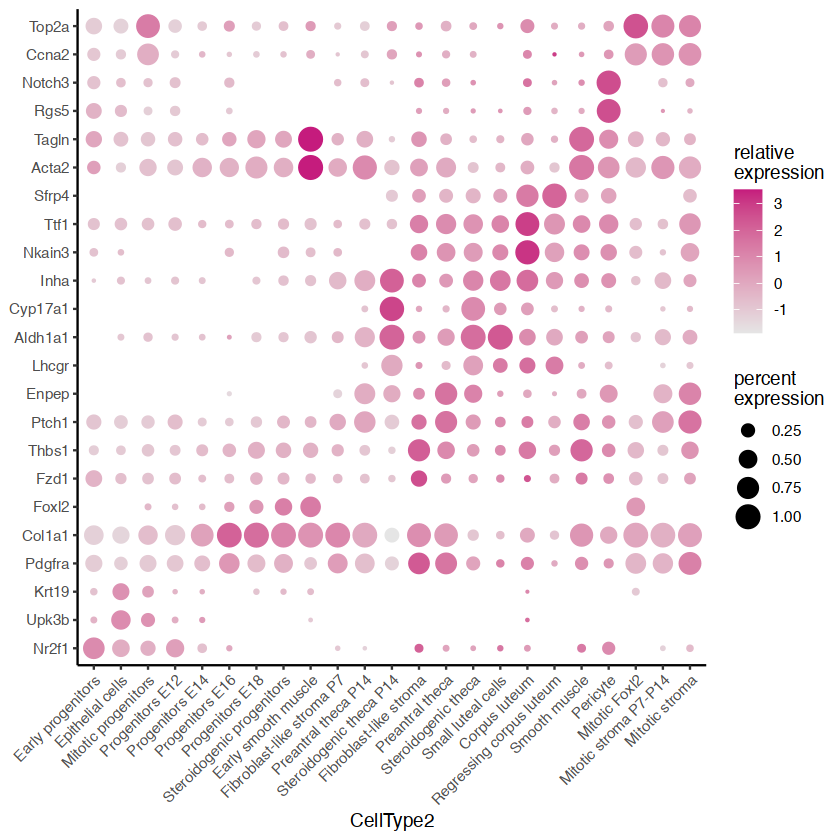

In [25]:
markers <- c(
#Early stroma progenitors
"Nr2f1",
# epithelial cells
"Upk3b","Krt19",  
#Embrio stroma progenitors
"Pdgfra","Col1a1",
#Progenitors
"Foxl2",
#Fibroblast-like stroma
"Fzd1","Thbs1",
#Steroidogenic Stroma
"Ptch1",
#Preantral theca
"Enpep","Lhcgr",
#Atral steroidogenic theca
"Aldh1a1","Cyp17a1",
#Atretic CL  Active 
"Inha",
#CL reg CL atretic follicles show high levels of SELK"Selk","Efhd1","Star",
"Nkain3", "Ttf1", "Sfrp4",
    
#Smooth muscle
"Acta2","Tagln", 
#Pericyte
"Rgs5","Notch3",
    

# Mitotic Ccna2
"Ccna2","Top2a"
)
#markers <- rev(markers)
dittoDotPlot(pbmc, markers, group.by = "CellType2") + coord_flip()


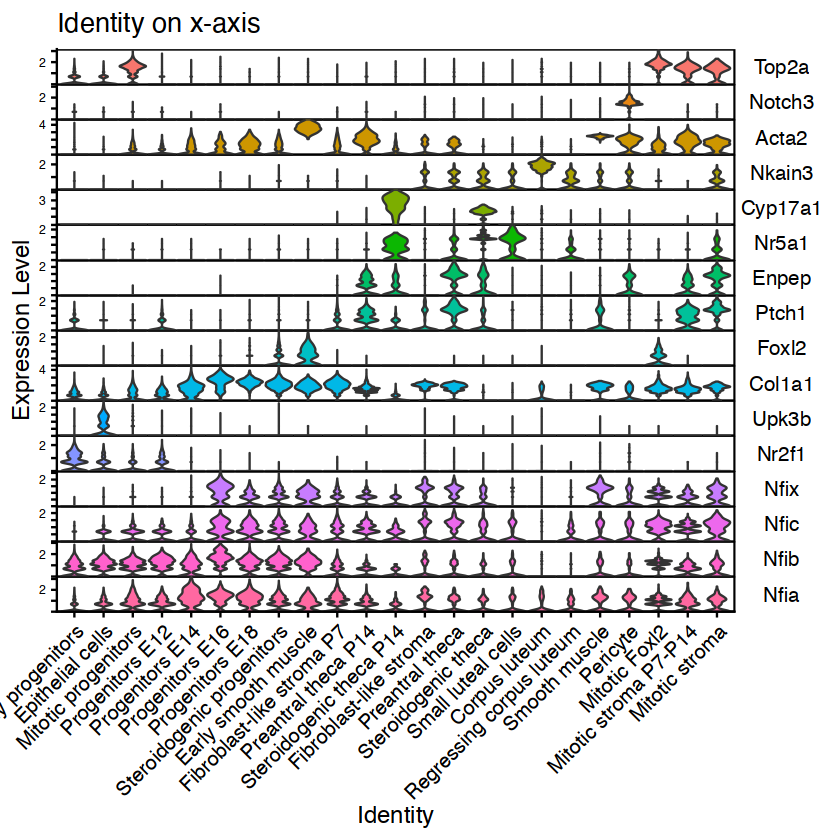

In [9]:
markersAll = c(
              "Nfia","Nfib","Nfic","Nfix","Nr2f1","Upk3b","Col1a1",
                "Foxl2","Ptch1","Enpep","Nr5a1","Cyp17a1","Nkain3","Acta2","Notch3"
              ,"Top2a")
markersAll = rev(markersAll)
VlnPlot(pbmc, markersAll,  stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "none") + ggtitle("Identity on x-axis")

In [32]:
table(pbmc[["CellType2"]])

CellType2
        Early progenitors          Epithelial cells       Mitotic progenitors 
                     2190                      1348                      1451 
          Progenitors E12           Progenitors E14           Progenitors E16 
                     1228                      1217                       603 
          Progenitors E18 Steroidogenic progenitors       Early smooth muscle 
                      730                      3661                       316 
Fibroblast-like stroma P7       Preantral theca P14   Steroidogenic theca P14 
                     2097                      2125                       270 
   Fibroblast-like stroma           Preantral theca       Steroidogenic theca 
                     4263                      2358                       779 
       Small luteal cells             Corpus luteum  Regressing corpus luteum 
                     1070                       673                       641 
            Smooth muscle                 

In [36]:
pbmc2 <- subset(pbmc, idents = c("Mitotic progenitors","Fibroblast-like stroma P7","Preantral theca P14",
                               "Steroidogenic theca P14","Mitotic Foxl2","Mitotic stroma P7-P14","Mitotic stroma"), invert = TRUE)

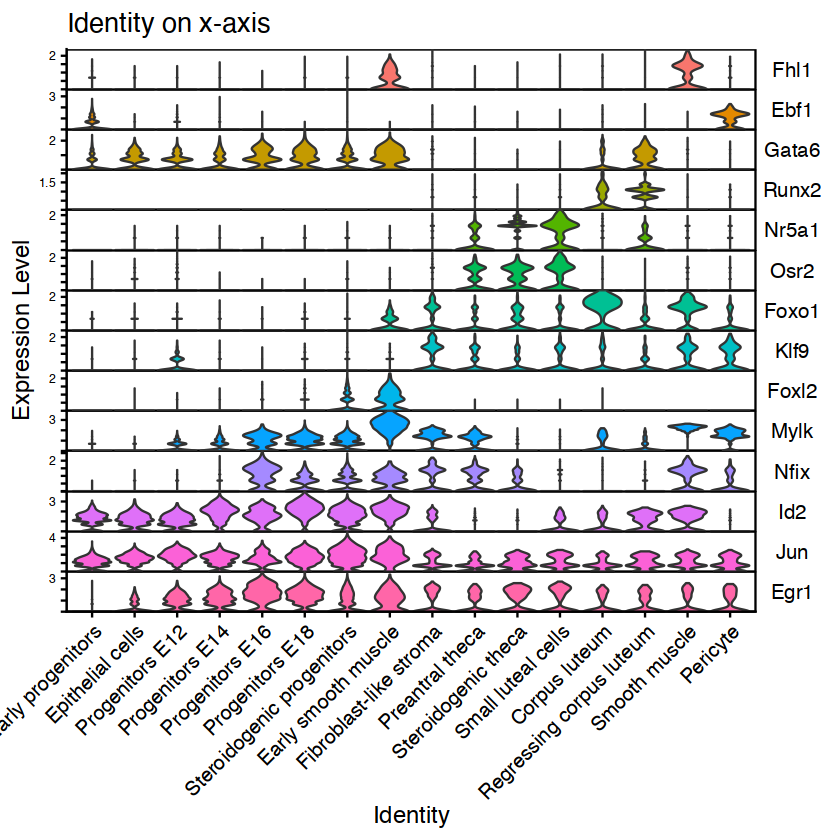

In [37]:
markersAll = c(
              "Egr1","Jun","Id2","Nfix","Mylk","Foxl2","Klf9","Foxo1","Osr2","Nr5a1","Runx2","Gata6","Ebf1"
              ,"Fhl1")
markersAll = rev(markersAll)
VlnPlot(pbmc2, markersAll,  stack = TRUE, sort = FALSE, flip = TRUE) +
        theme(legend.position = "none") + ggtitle("Identity on x-axis")